### DOMAIN: Automobile 

**CONTEXT:** The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. 
    The vehicle may be viewed from one of many different angles.

**DATA DESCRIPTION:**        
    The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.
    
    All the features are numeric i.e. geometric features extracted from the silhouette.

**PROJECT OBJECTIVE:**    
    Apply dimensionality reduction technique – PCA and train a model using principal components instead of training the model using just the raw data

In [46]:
#Importing required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn import metrics
from scipy.stats import zscore

###### Data: Import, clean and pre-process the data

In [2]:
#reading data and viewing few samples of data
vehicleDfRaw = pd.read_csv('Part3 - vehicle.csv')
vehicleDfRaw.sample(3)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
65,89,41.0,75.0,143.0,56.0,7,146.0,46.0,19.0,137,170.0,317.0,156.0,76.0,18.0,5.0,184.0,188,car
41,88,37.0,51.0,105.0,52.0,5,119.0,57.0,17.0,128,135.0,207.0,125.0,86.0,8.0,16.0,179.0,183,van
619,97,55.0,96.0,170.0,54.0,10,216.0,31.0,24.0,173,219.0,685.0,218.0,75.0,0.0,4.0,184.0,193,car


In [3]:
#check the data types, size of dataframe in mem
vehicleDfRaw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

    Only class column is of object data type and rest are either float or int.

In [4]:
vehicleDfRaw.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


In [5]:
meanMedianComparison = vehicleDfRaw.describe().T[['mean','50%']]
meanMedianComparison['mean']-meanMedianComparison['50%']

compactness                     0.678487
circularity                     0.828775
distance_circularity            2.110451
radius_ratio                    1.888095
pr.axis_aspect_ratio            0.678910
max.length_aspect_ratio         0.567376
scatter_ratio                  11.901775
elongatedness                  -2.066272
pr.axis_rectangularity          0.582444
max.length_rectangularity       1.998818
scaled_variance                 9.631079
scaled_variance.1              75.994076
scaled_radius_of_gyration       1.209716
scaled_radius_of_gyration.1     0.947743
skewness_about                  0.364286
skewness_about.1                1.602367
skewness_about.2                0.919527
hollows_ratio                  -1.367612
dtype: float64

- Here column radius_ratio, pr.axis_aspect_ratio , max.length_aspect_ratio , scaled_variance.1, scaled_radius_of_gyration.1 columns seems to have outlier, we need to check the data using boxplot. The 75% value and max are having bit more difference  than expected.
- Mean and median are closed each other in terms of value for compactness, circularity,  distance_circularity, radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, pr.axis_rectangularity, max.length_rectangularity, scaled_radius_of_gyration, scaled_radius_of_gyration.1 , skewness_about, skewness_about.1, skewness_about.2 so these data are normally distributed.
- Mean is greater than Median for scatter_ratio, scaled_variance,  scaled_variance.1 so the data is right skewed for these columns.

In [6]:
#check if the values are null
vehicleDfRaw.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

- There are null values observed for few of the column - for all these we need replace null values with median

In [7]:
#convert class column as category
vehicleDfRaw['class']=vehicleDfRaw['class'].astype('category')

In [8]:
#Replacing the missing values by median - for all column except class column
for i in vehicleDfRaw.columns[:17]:
    median_value = vehicleDfRaw[i].median()
    vehicleDfRaw[i] = vehicleDfRaw[i].fillna(median_value)

In [9]:
vehicleDfRaw.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

- No more null values observed.

**EDA and visualisation**: 

- Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.
- For example: Use your best analytical approach to build this report. Even you can mix match columns to create new columns which can be used for better analysis. Create your own features if required. Be highly experimental and analytical here to find hidden patterns.

D:\anaconda\envs\gl\lib\site-packages\ipykernel_launcher.py:14: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


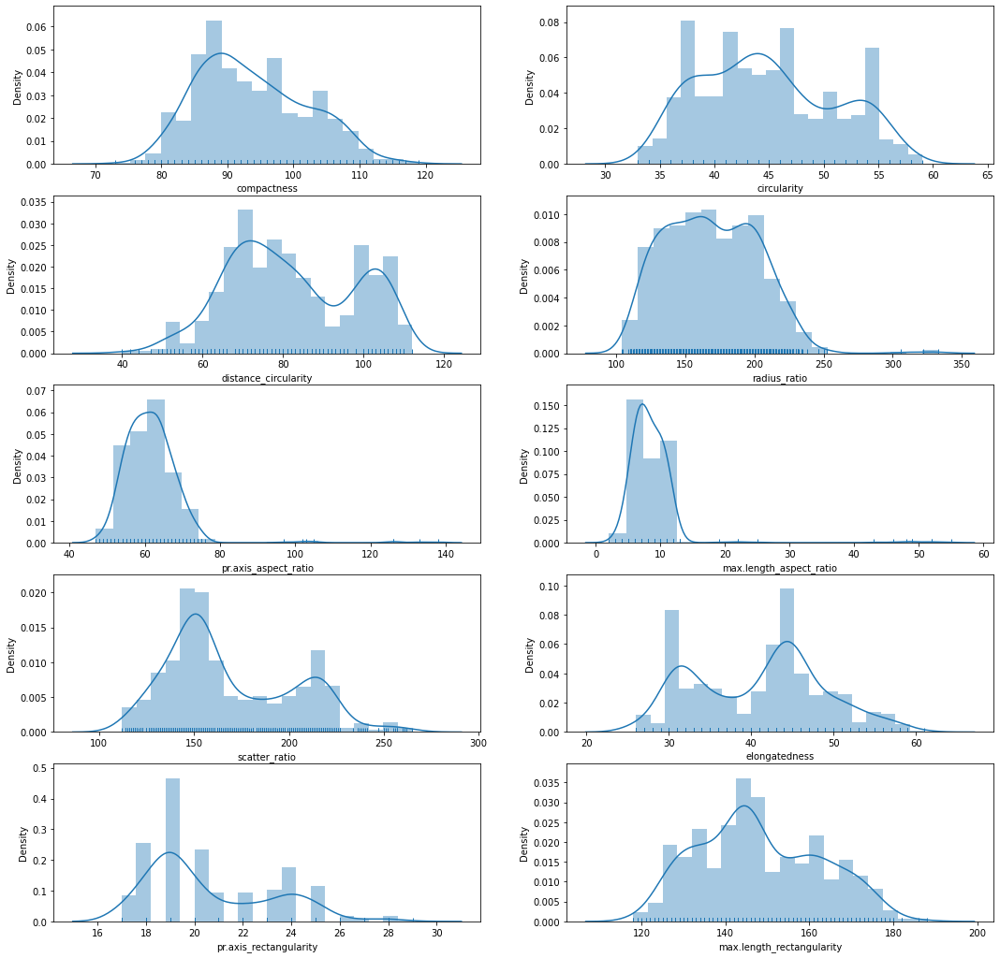

In [10]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(5,2, figsize=(18,18))
listOfColumns = vehicleDfRaw.columns[:10]
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.distplot(vehicleDfRaw[listOfColumns[index]],bins=20,rug=True,ax = ax[j][i]);            
            index = index + 1 
fig.show()

- Bimodality is observed in  scatter_ratio, elongatedness, pr.axis_rectangularity, max.length_rectangularity, circularity, distance_circularity.
- Normal distribution observed in pr.axis_aspect_ratio, max.length_aspect_ratio, compactness columns.
- Right Skew data observed in circularity column.


D:\anaconda\envs\gl\lib\site-packages\ipykernel_launcher.py:14: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


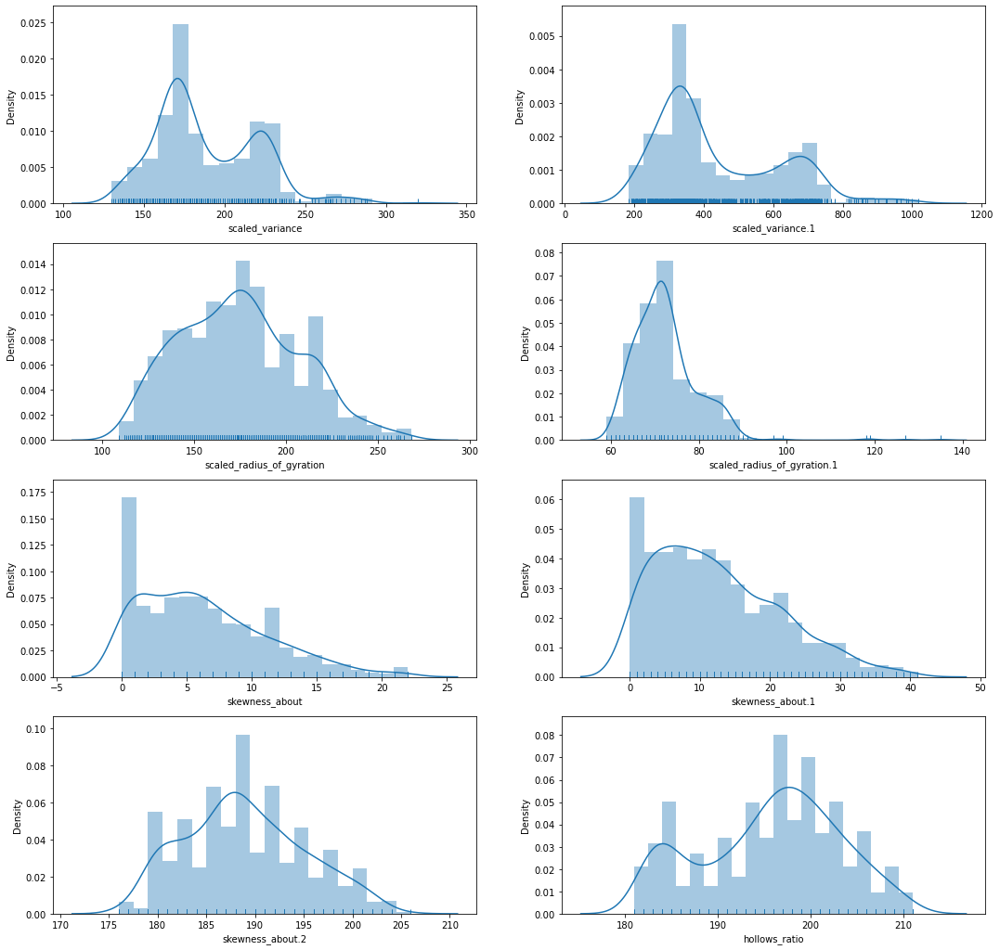

In [11]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(4,2, figsize=(18,18))
listOfColumns = vehicleDfRaw.columns[10:18]
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.distplot(vehicleDfRaw[listOfColumns[index]],bins=20,rug=True,ax = ax[j][i]);            
            index = index + 1 
fig.show()

- Bimodality is observed in  hollows_ratio, scaled_variance , scaled_variance.1.
- Normal distribution observed in skewness_about.2, scaled_radius_of_gyration, scaled_radius_of_gyration.1 columns.
- Right Skew data observed in skewness_about , skewness_about.1 column.


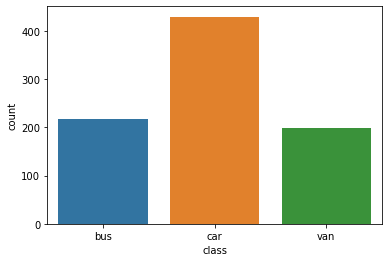

In [12]:
#check distribution of class column
sns.countplot(vehicleDfRaw['class']);

- Records with class column value as car is having more count

33 percentile :  89.0
66 percentile :  97.0


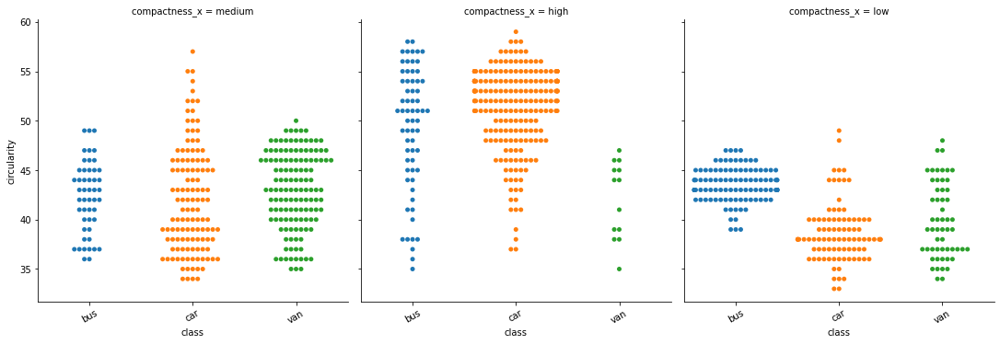

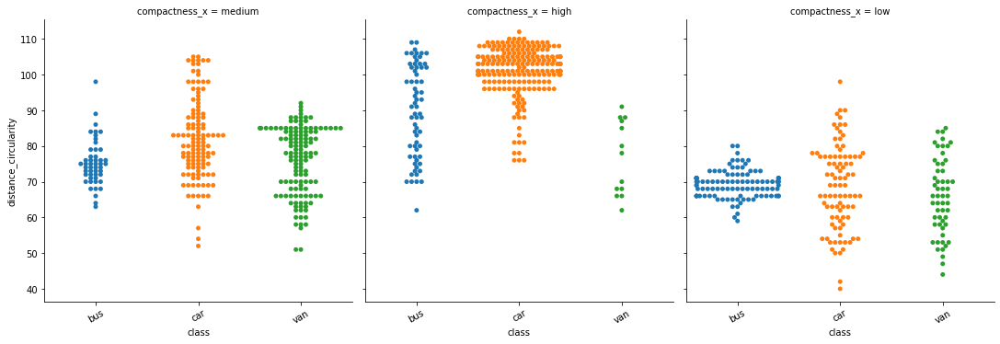

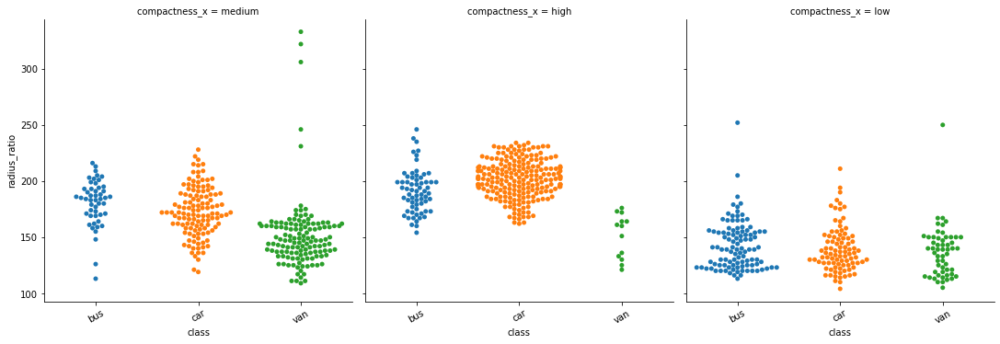

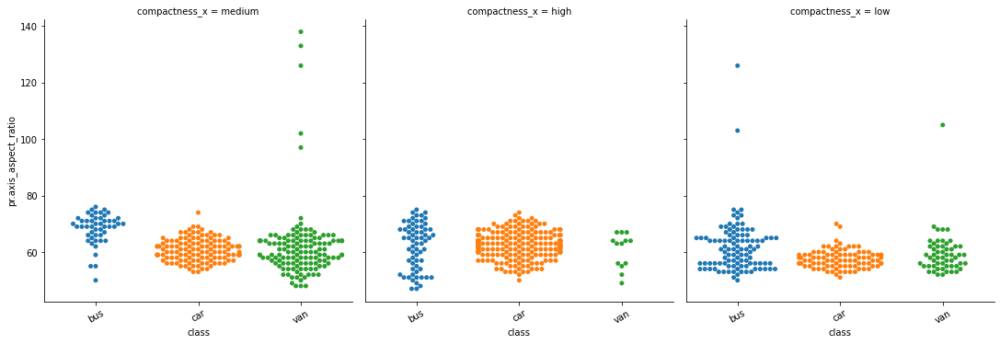

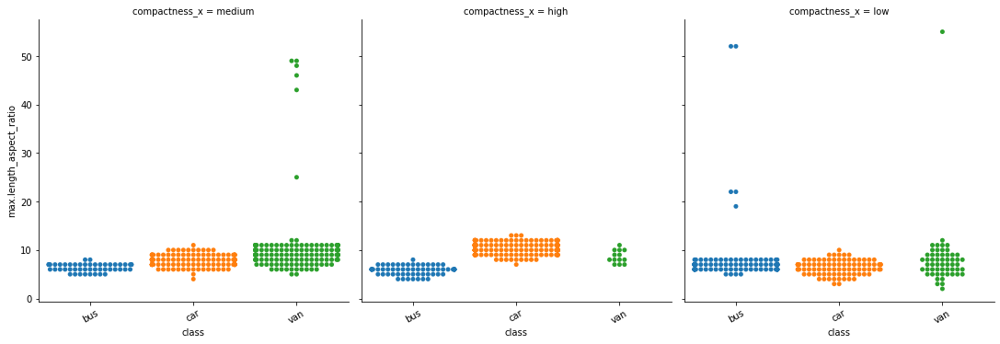

...

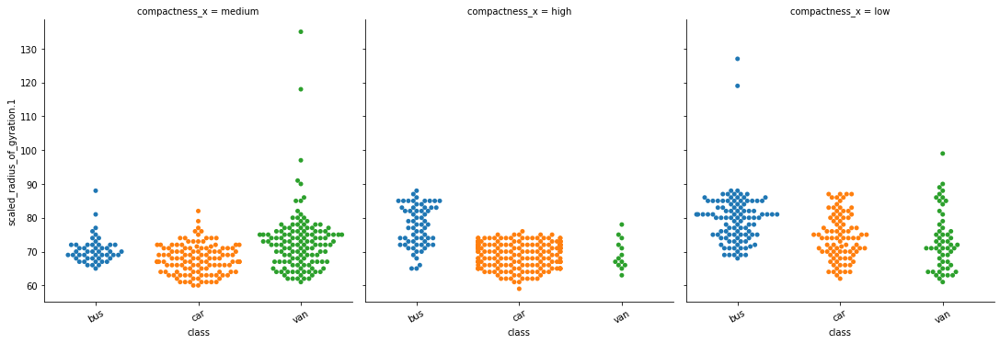

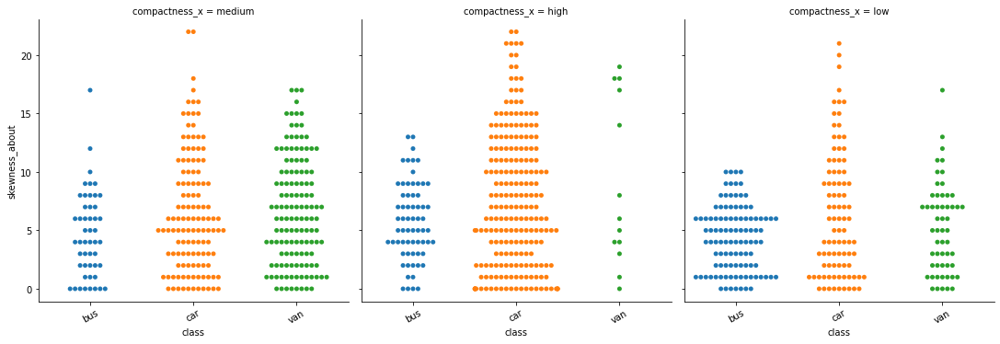

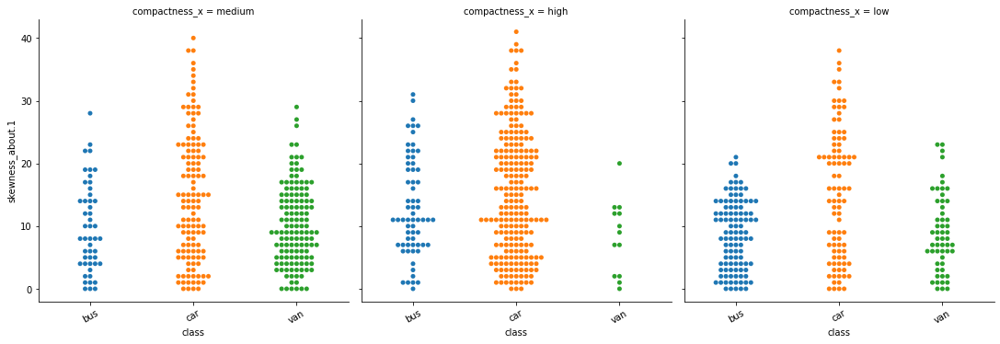

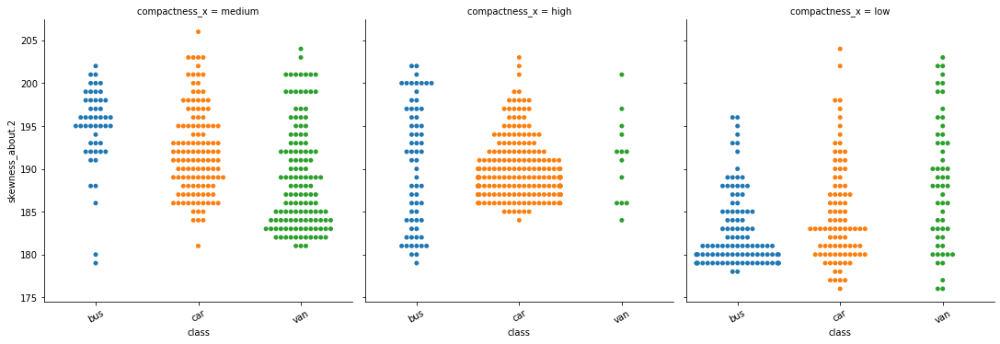

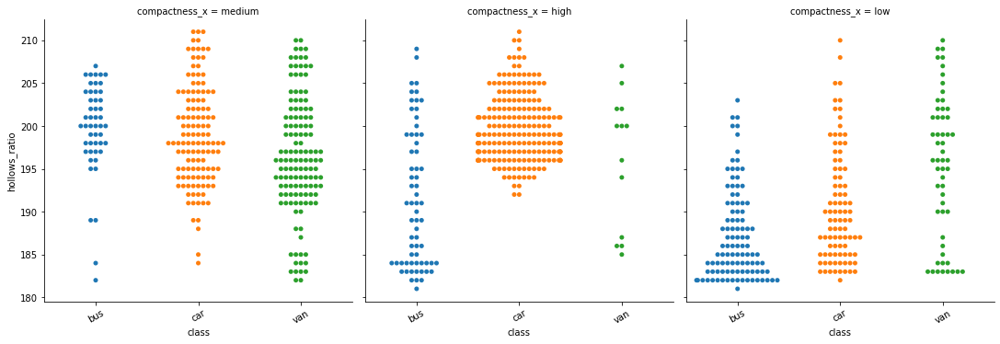

In [13]:
import warnings
warnings.simplefilter("ignore", UserWarning)

quant33 = np.percentile(vehicleDfRaw['compactness'],33)
quant66 = np.percentile(vehicleDfRaw['compactness'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66)

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawCompactnessCat = vehicleDfRaw.compactness.apply(categoriseData)
vehicleDfRawCompactnessGraph = pd.merge(vehicleDfRawCompactnessCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="compactness_x",
               data=vehicleDfRawCompactnessGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the compactness column
- The compactness column are divided in 3 groups :: 
        
        below value 89  is considered as low
        value between  89 and 97 is considered as medium
        above value 97 are considered as High

- When we observe data the class car and bus have longer distribution against other variables.
- For class van, longer distribution observed for medium compactness when compared to other type of compactness

33 percentile :  42.0
66 percentile :  47.0


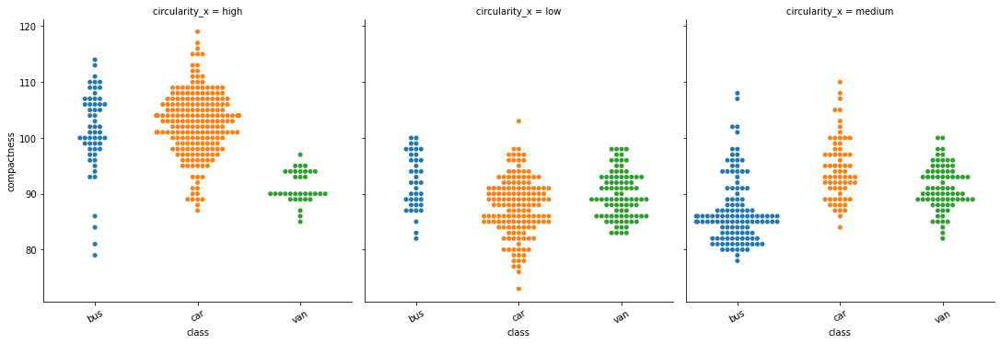

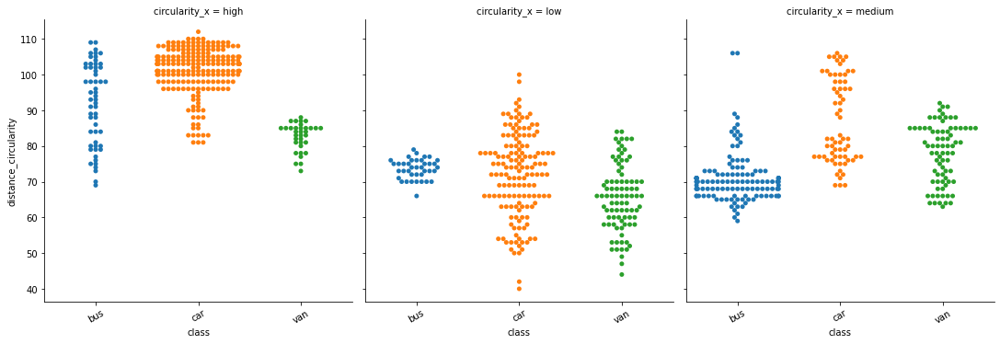

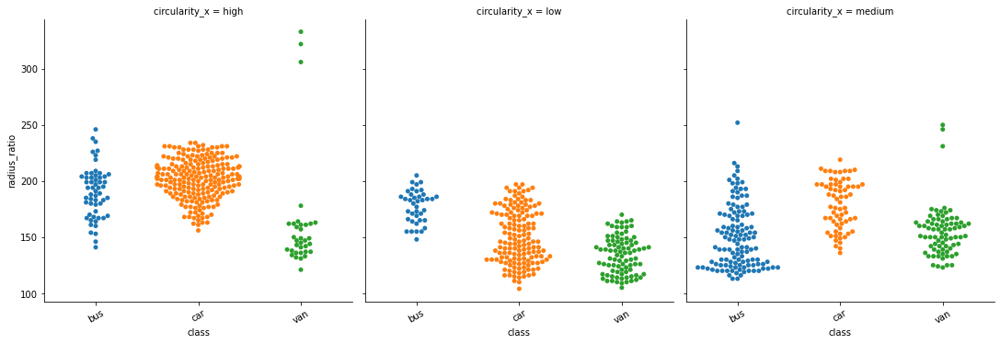

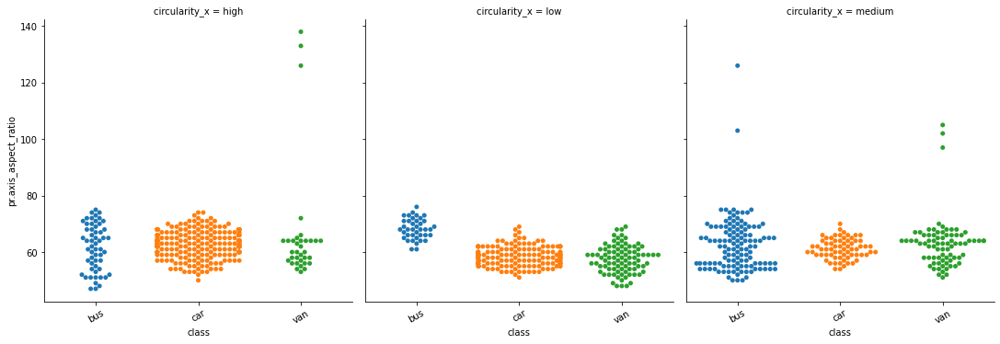

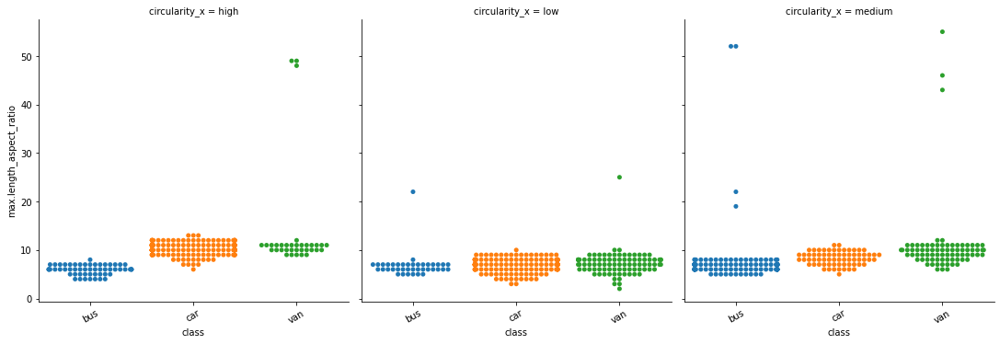

...

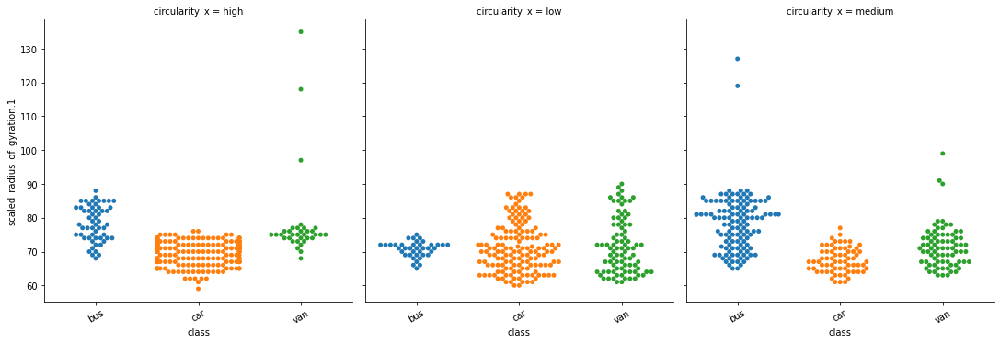

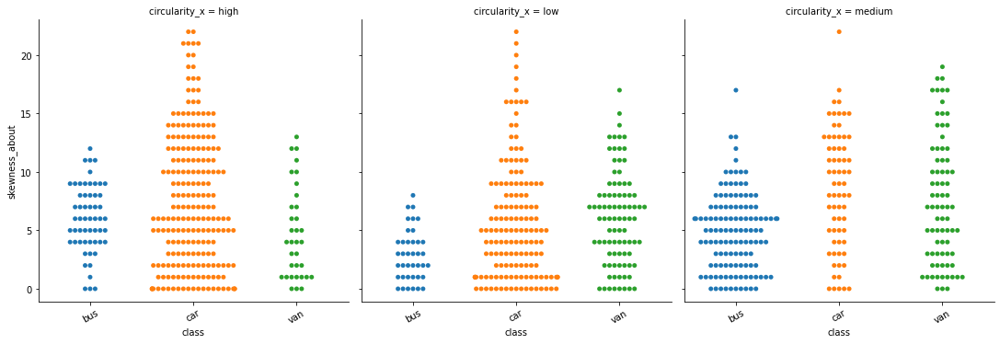

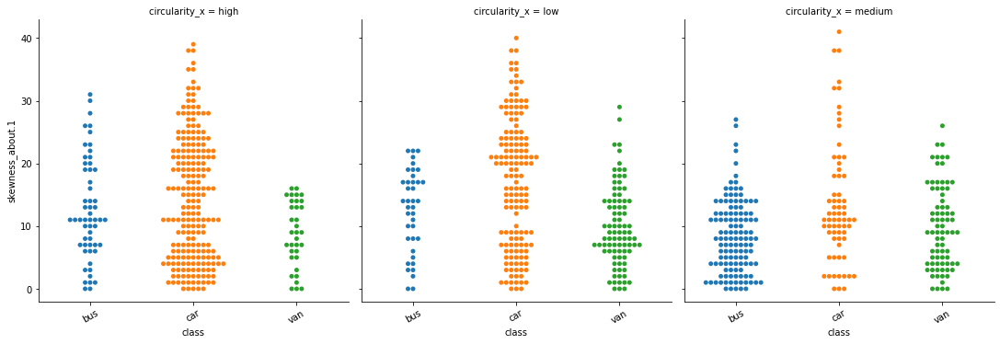

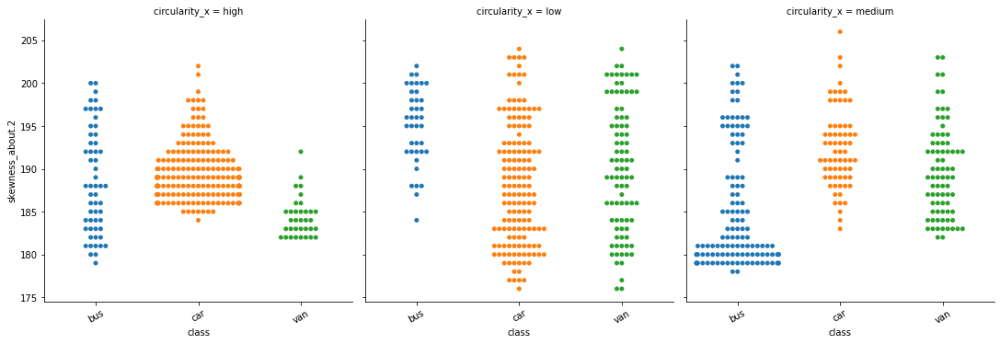

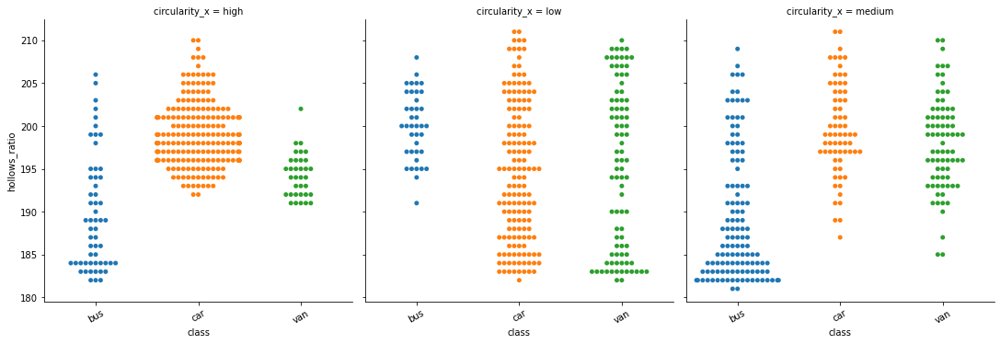

In [14]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['circularity'],33)
quant66 = np.percentile(vehicleDfRaw['circularity'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66)

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawCircularityCat = vehicleDfRaw.circularity.apply(categoriseData)
vehicleDfRawCircularityGraph = pd.merge(vehicleDfRawCircularityCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="circularity_x",
               data=vehicleDfRawCircularityGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the circularity column
- The circularity column are divided in 3 groups :: 
        
        below value 42  is considered as low
        value between  42 and 47 is considered as medium
        above value 47 are considered as High
        
- Frequncy of data  :: The distribution of data is  approximately  equal among different  circularity groups
- When we observe data, the class car and bus have longer distribution against other variables.
- When we observe data of class v/s elongatedness, van class seems to be higher than value 40 with different circularity.

33 percentile :  150.0
66 percentile :  186.0


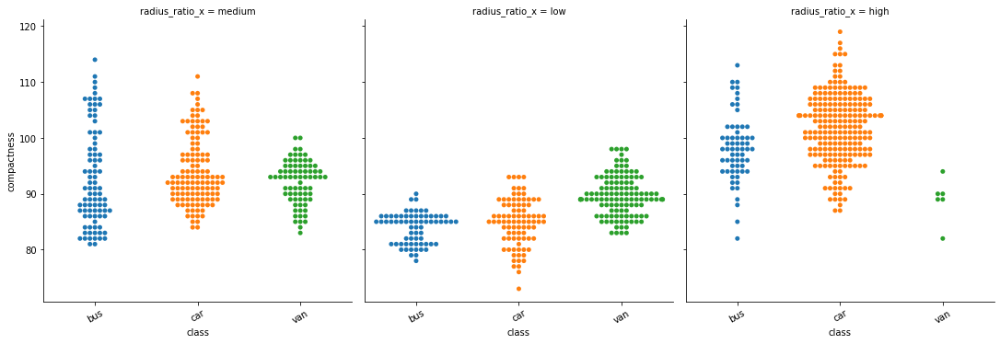

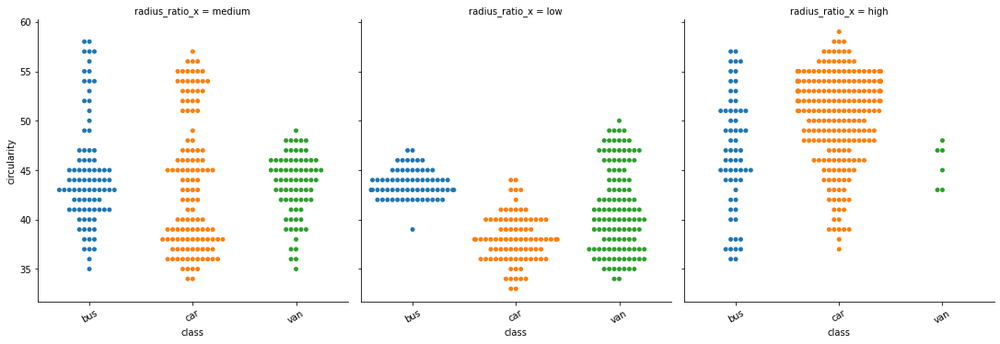

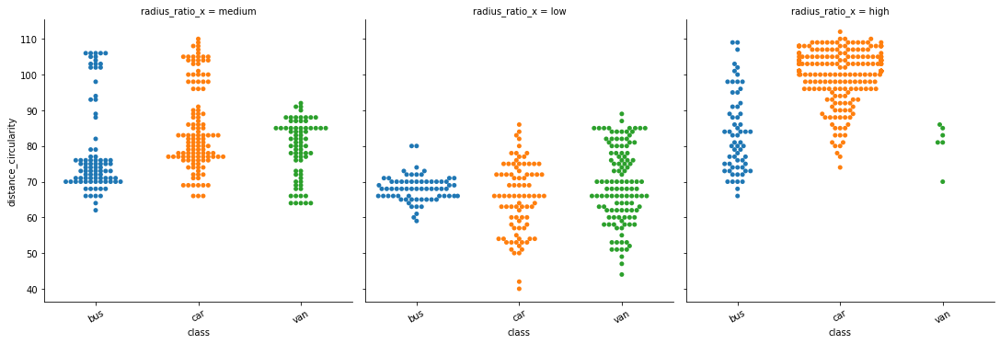

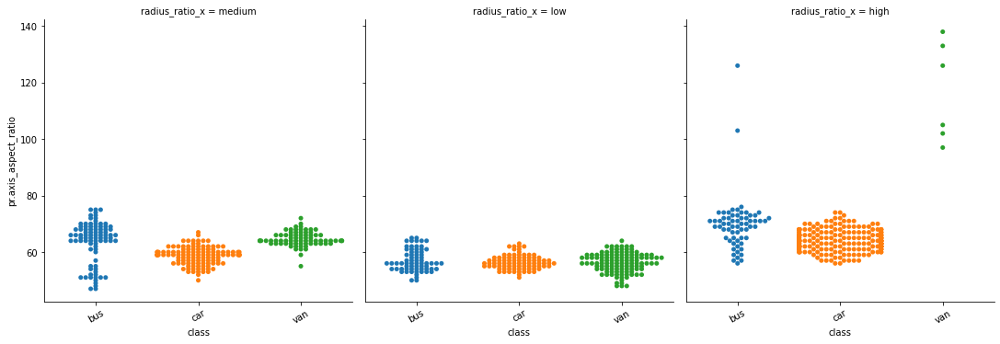

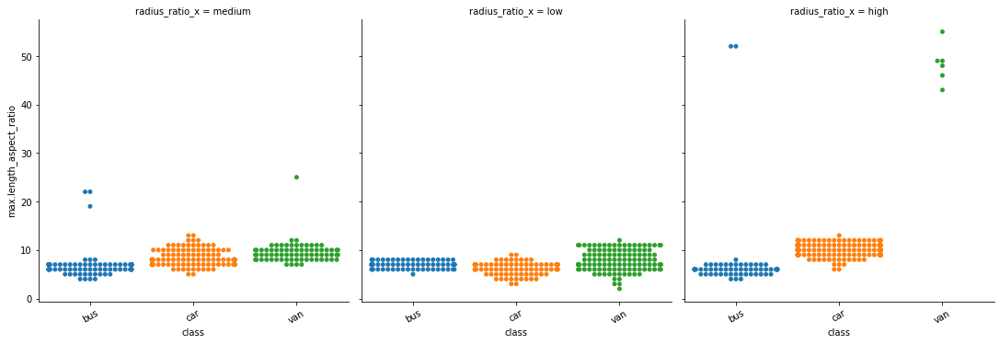

...

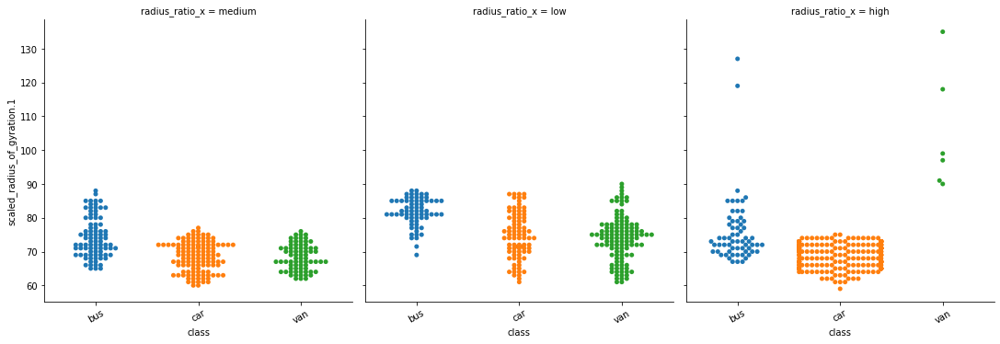

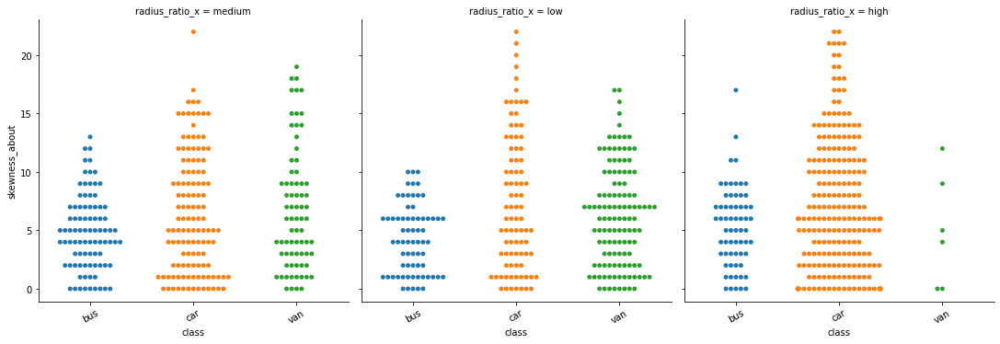

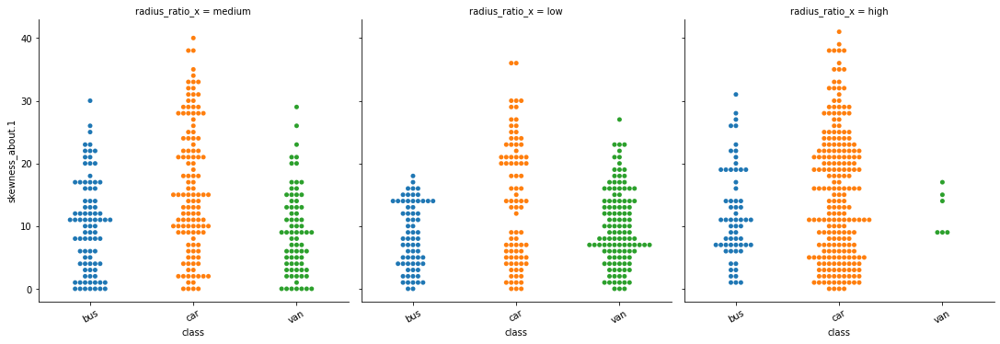

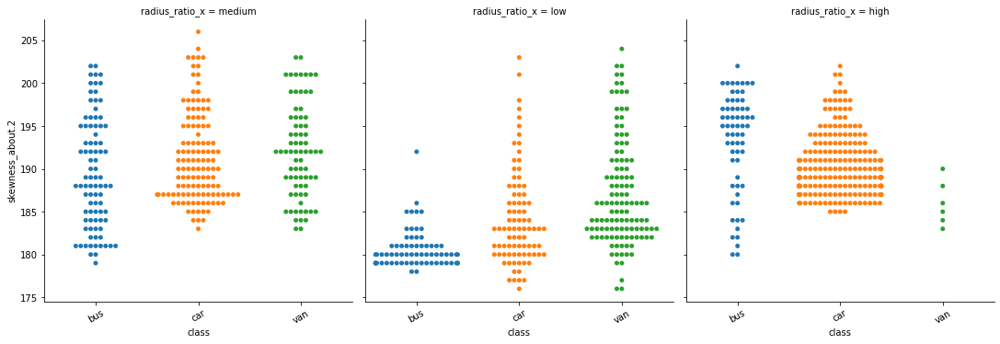

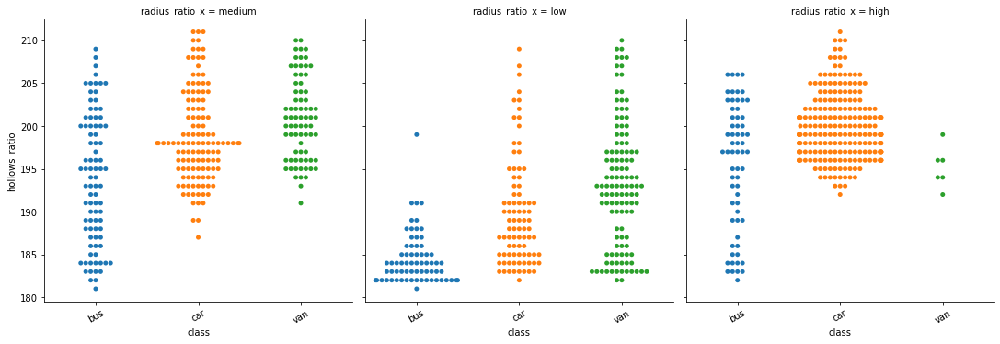

In [15]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['radius_ratio'],33)
quant66 = np.percentile(vehicleDfRaw['radius_ratio'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66)

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawRadiusRatioCat = vehicleDfRaw.radius_ratio.apply(categoriseData)
vehicleDfRawRadiusRatioGraph = pd.merge(vehicleDfRawRadiusRatioCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'circularity', 'distance_circularity',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="radius_ratio_x",
               data=vehicleDfRawRadiusRatioGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the radius_ratio column
- The radius_ratio column are divided in 3 groups :: 
        
        below value 150  is considered as low
        value between  150 and 186 is considered as medium
        above value 186 are considered as High
        
- Frequncy of data  :: The distribution of data is  approximately  equal among different  radius_ratio groups
- More Data point observed for Car class - for high radisu ratio group.
- When we observe data for radius_ratio medium and low, the class car and bus have longer distribution against other variables.
- When we observe data of class van among different column, the high radius_ratio seems to have very less data point.

33 percentile :  150.0
66 percentile :  177.70000000000005


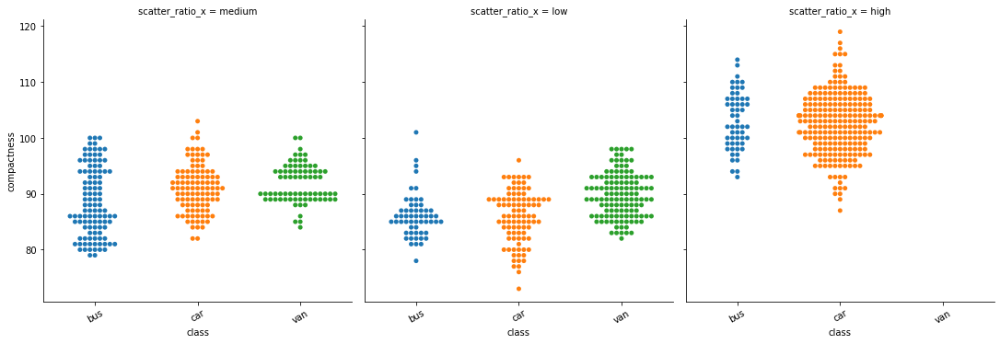

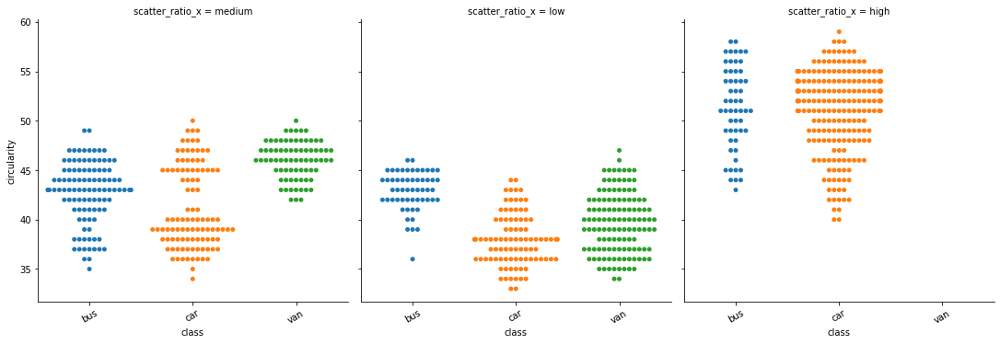

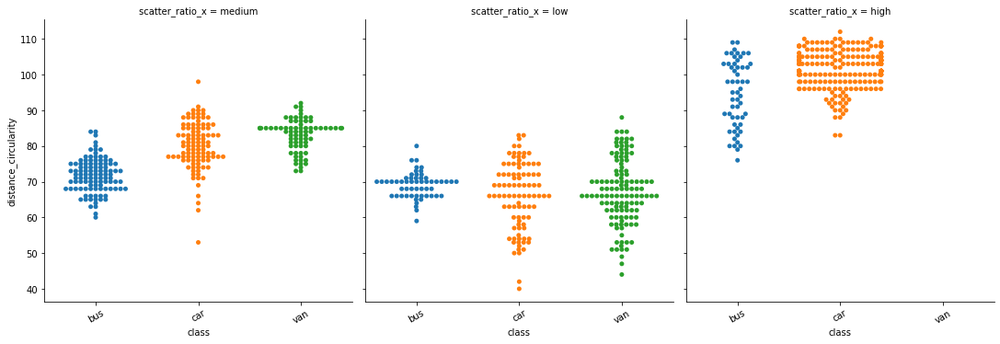

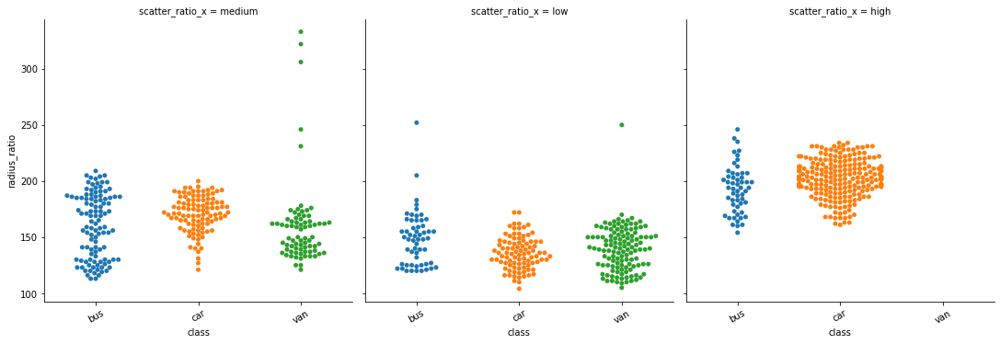

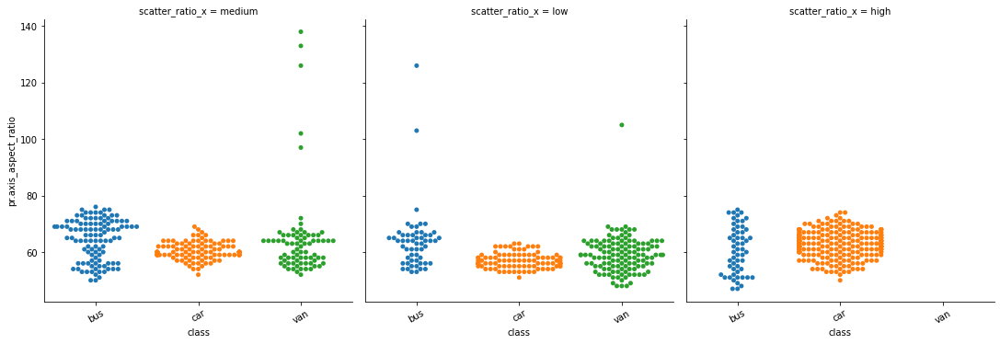

...

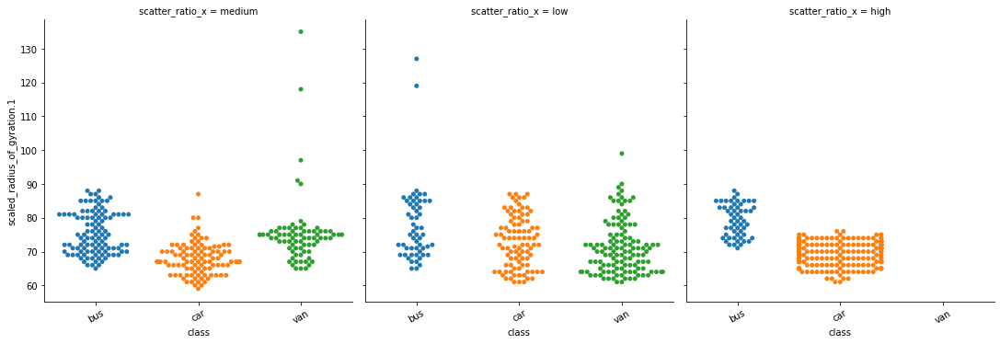

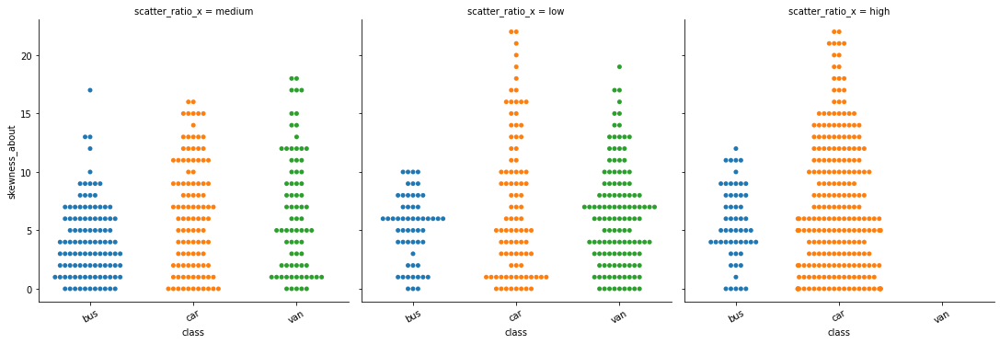

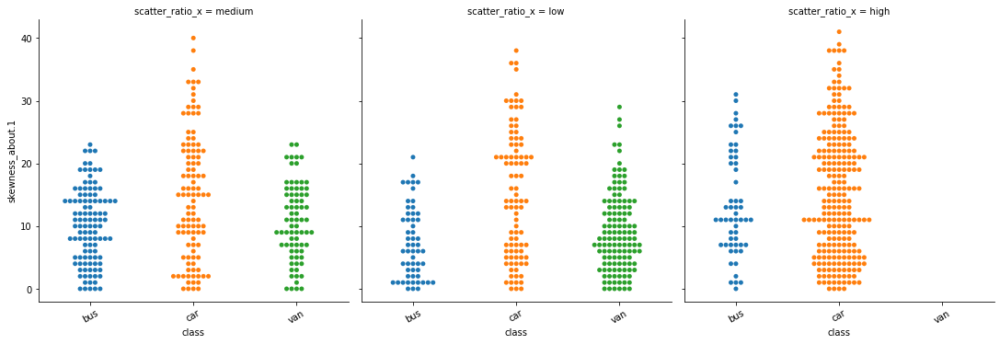

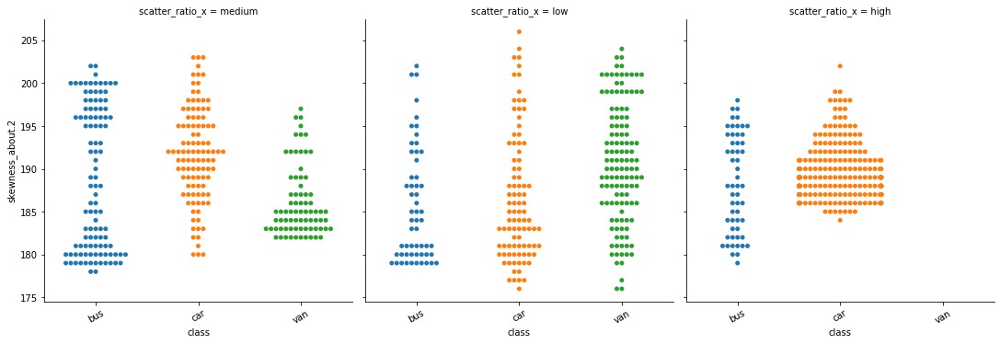

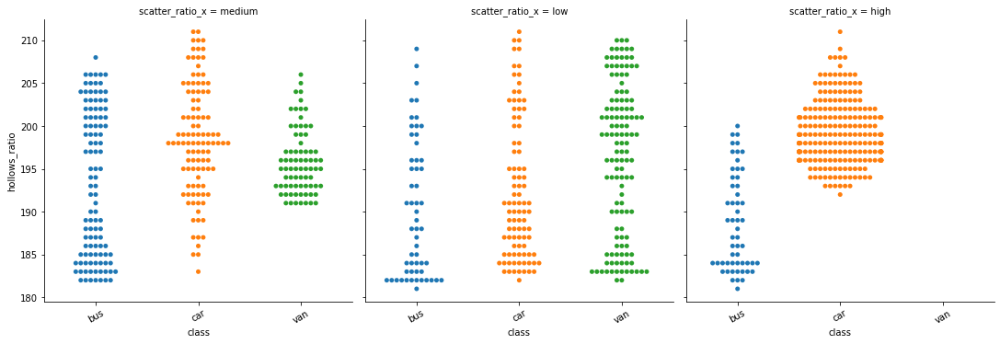

In [16]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['scatter_ratio'],33)
quant66 = np.percentile(vehicleDfRaw['scatter_ratio'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66)


def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawScatterRatioCat = vehicleDfRaw.scatter_ratio.apply(categoriseData)
vehicleDfRawScatterRatioGraph = pd.merge(vehicleDfRawScatterRatioCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="scatter_ratio_x",
               data=vehicleDfRawScatterRatioGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the scatter_ratio column
- The scatter_ratio column are divided in 3 groups :: 
        
        below value 150 is considered as low
        value between 150 and 177 is considered as medium
        above value 177 are considered as High
        
- Class Car is having more data point (dominant) for High scatter ratio category.
- Frequncy of data  :: The distribution of data is  approximately equal among different scatter_ratio groups
- When we observe data for scatter_ratio medium and low, the class car and bus have longer distribution against other variables.
- When we observe data of class van among different column, the high scatter_ratio doesnt seems to data point.

 33 percentile : 36.0
 66 percentile : 45.0


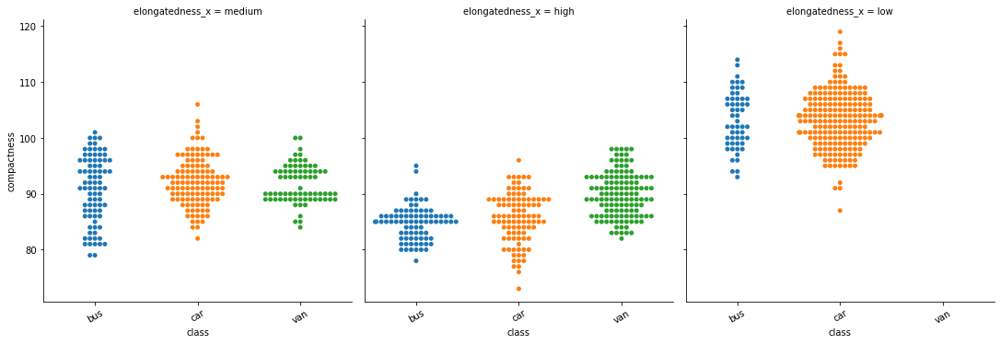

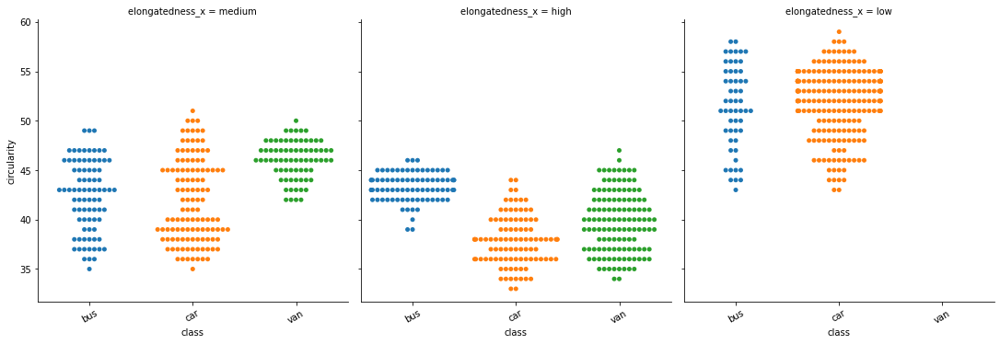

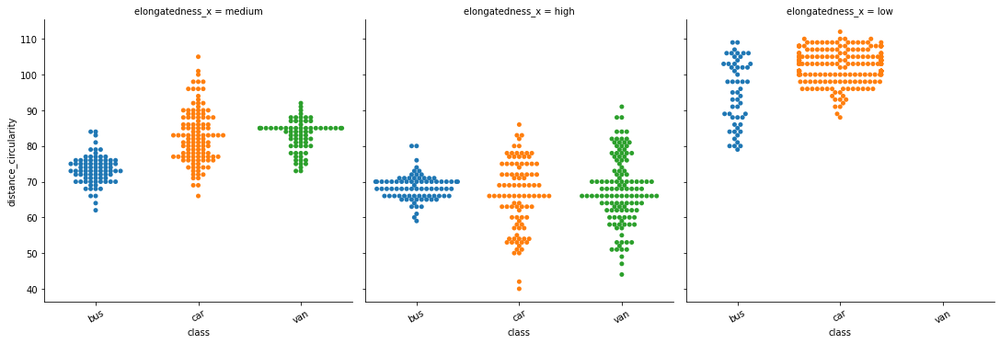

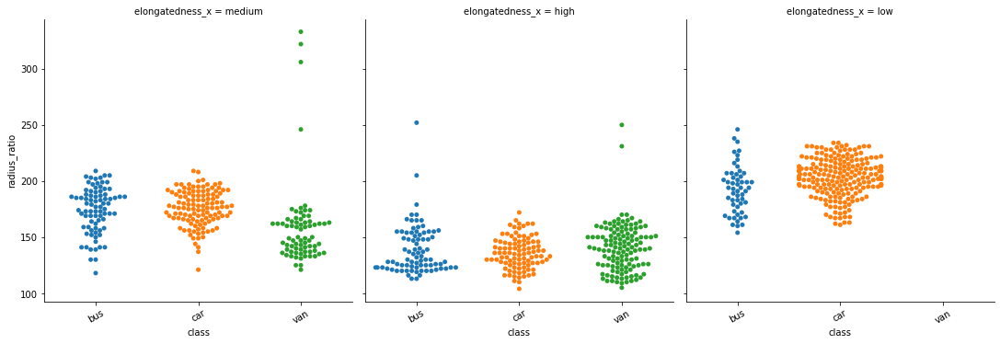

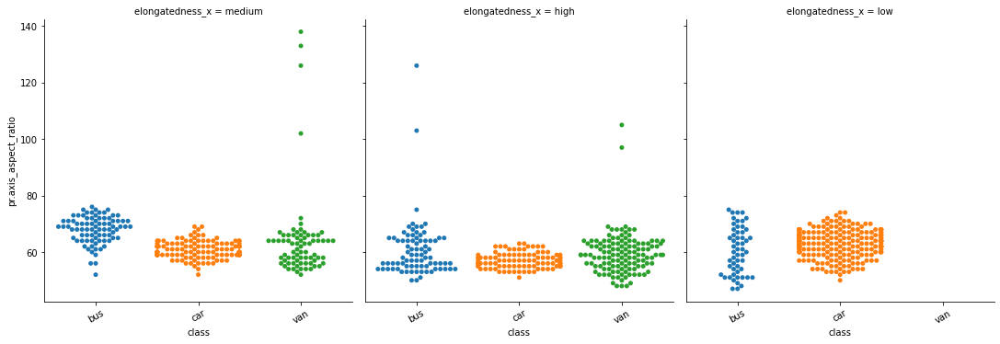

...

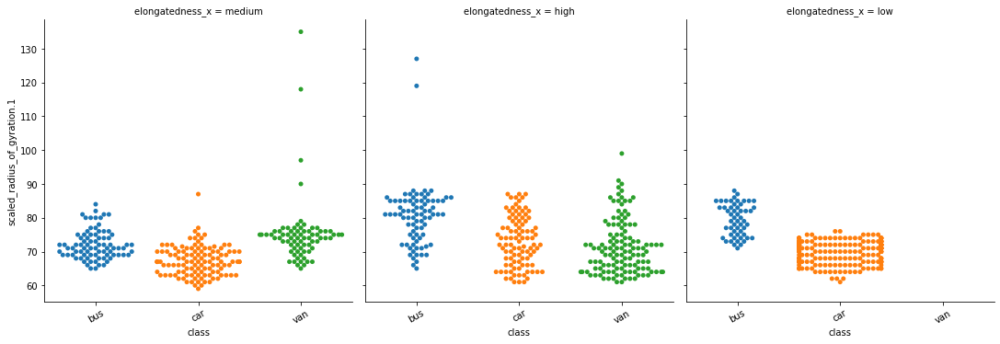

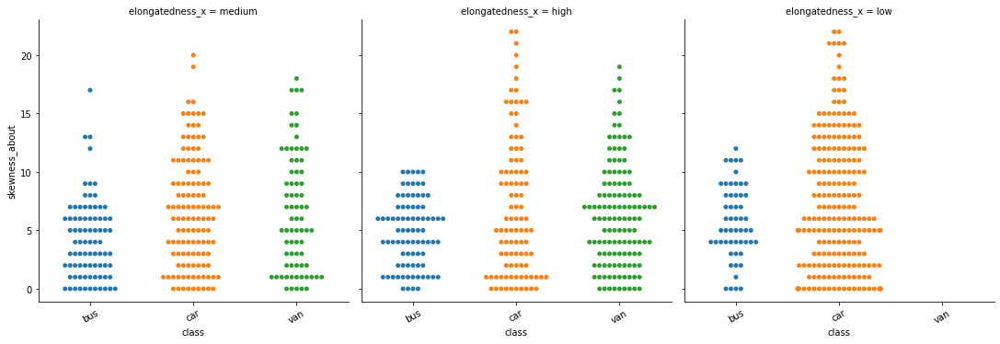

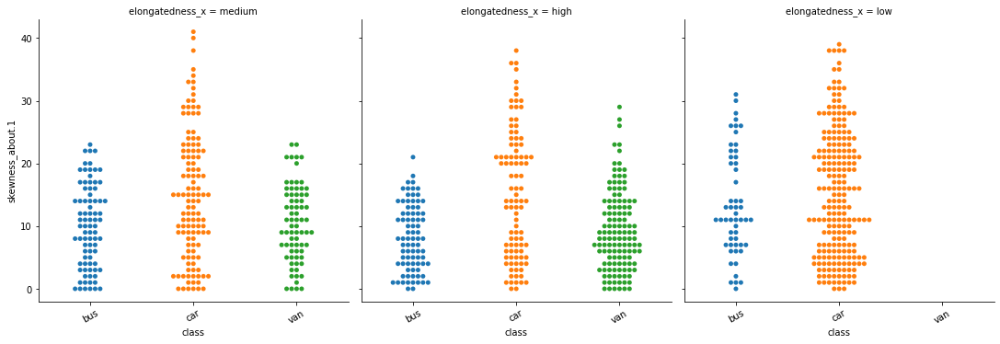

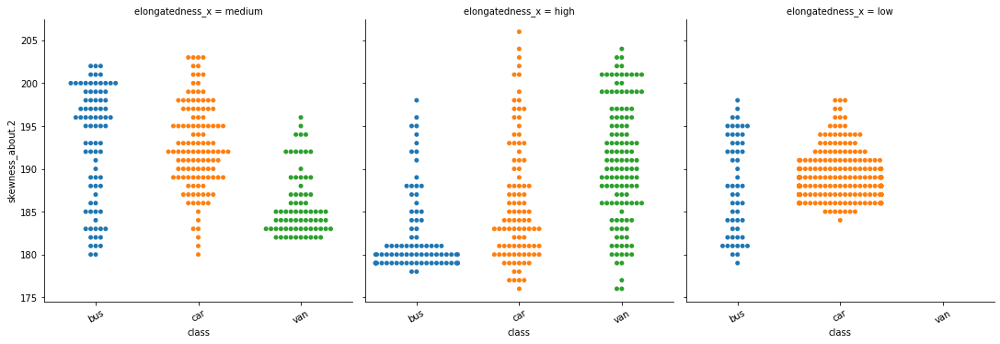

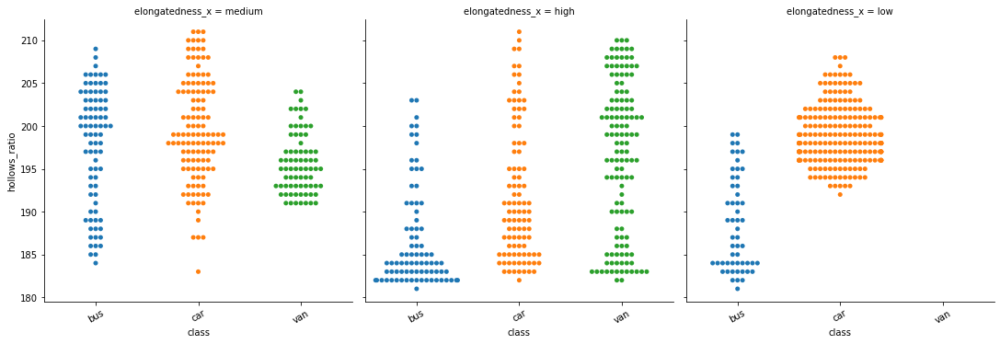

In [17]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['elongatedness'],33)
quant66 = np.percentile(vehicleDfRaw['elongatedness'],66)

print(" 33 percentile :", quant33)
print(" 66 percentile :", quant66)

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawElongatednessCat = vehicleDfRaw.elongatedness.apply(categoriseData)
vehicleDfRawElongatednessGraph = pd.merge(vehicleDfRawElongatednessCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="elongatedness_x",
               data=vehicleDfRawElongatednessGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the elongatedness column
- The elongatedness column are divided in 3 groups :: 
        
        below value 36 is considered as low
        value between 36 and 45 is considered as medium
        above value 45 are considered as High
        
- elongatedness and scatter ratio seems to have similar kind of distribution.

33 percentile :  4.0
66 percentile :  8.0


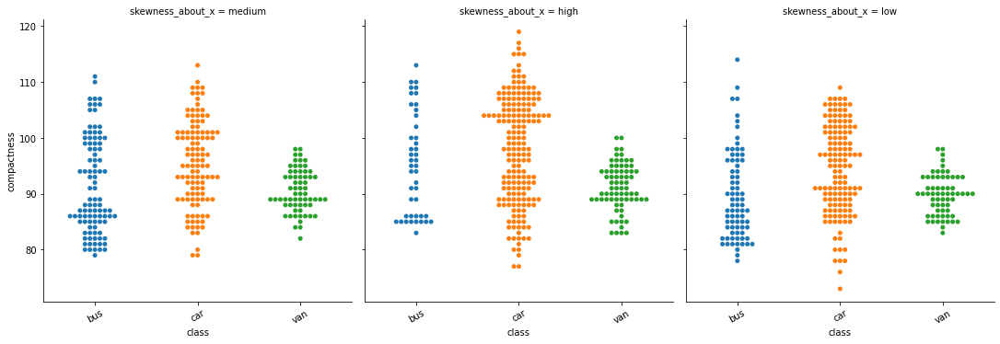

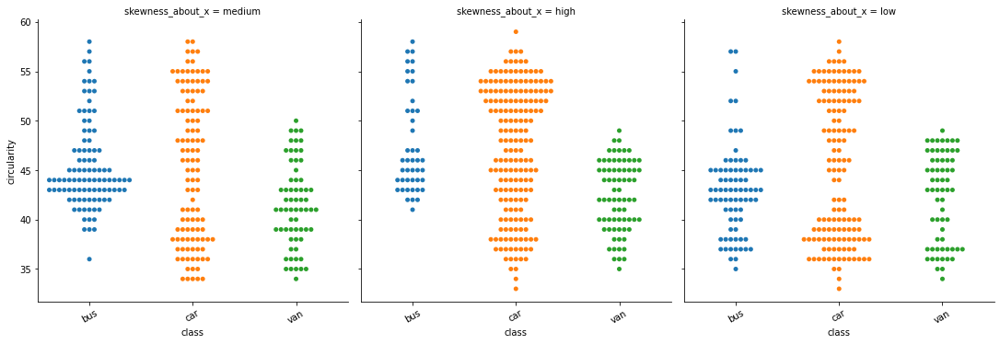

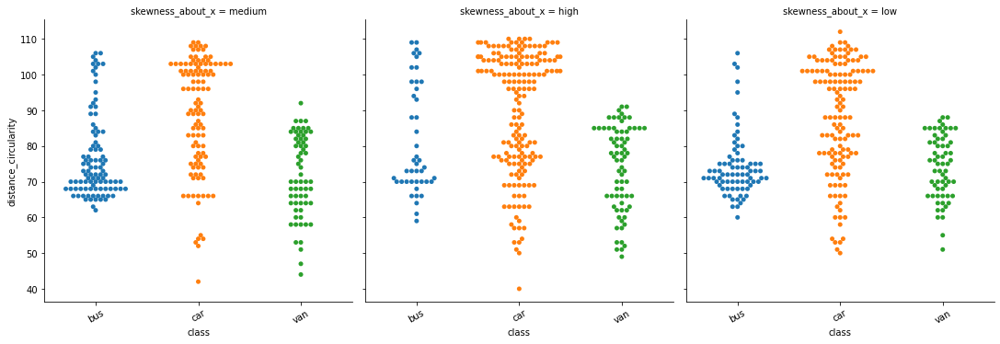

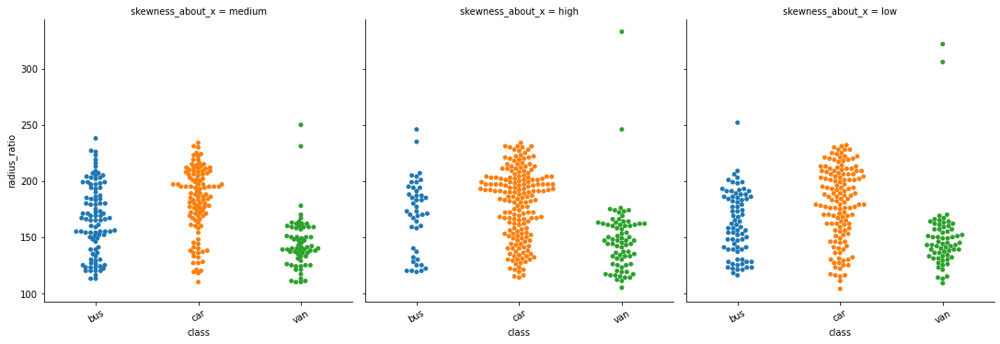

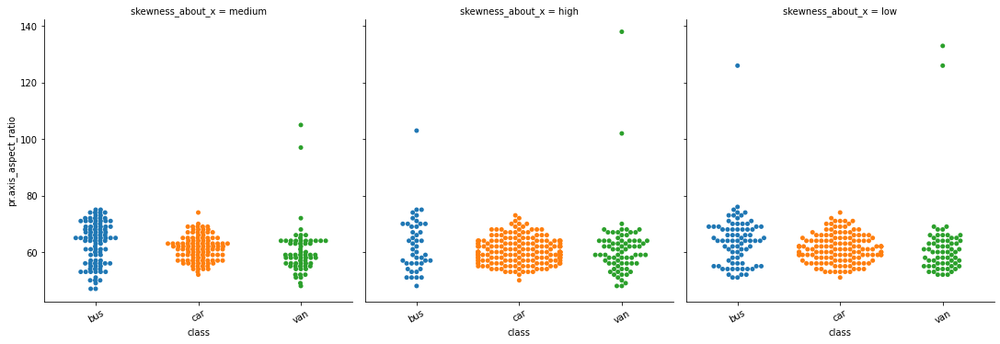

...

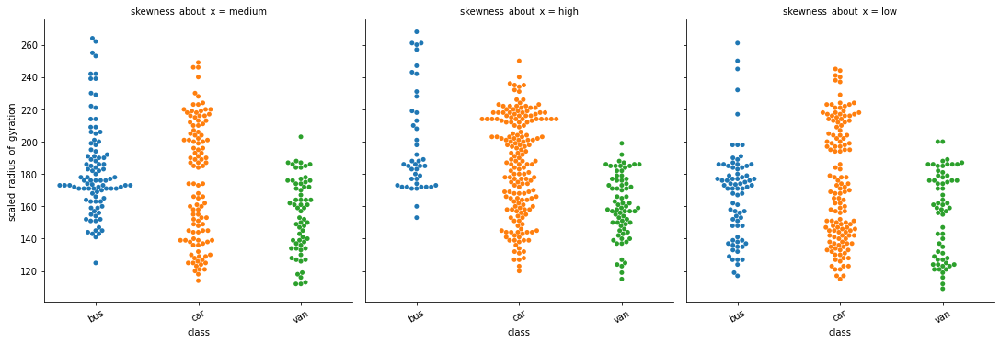

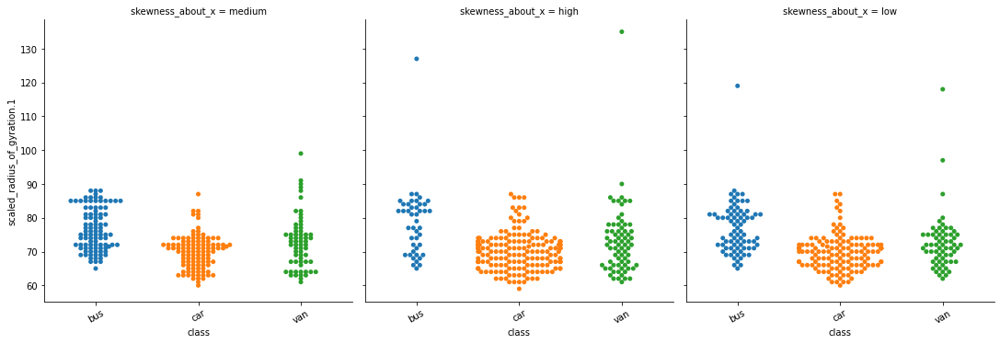

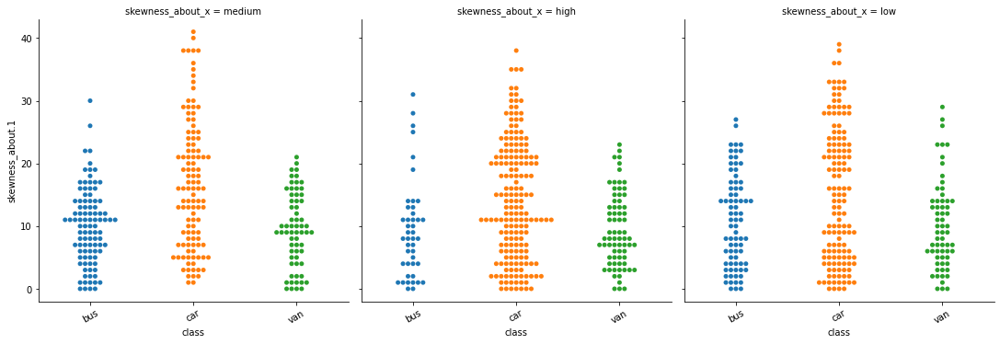

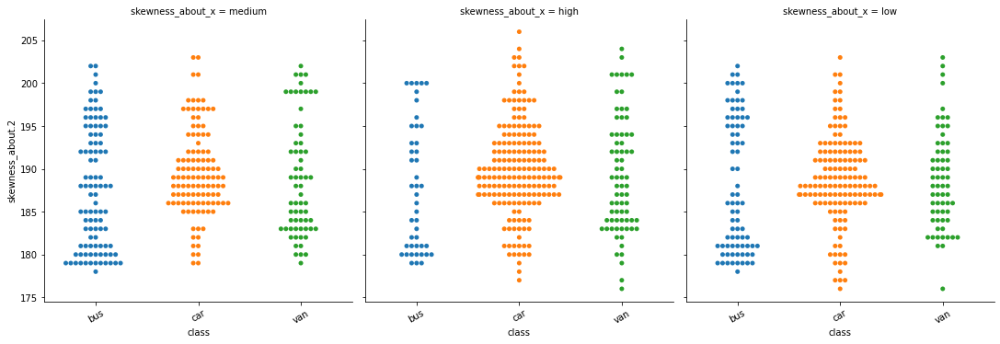

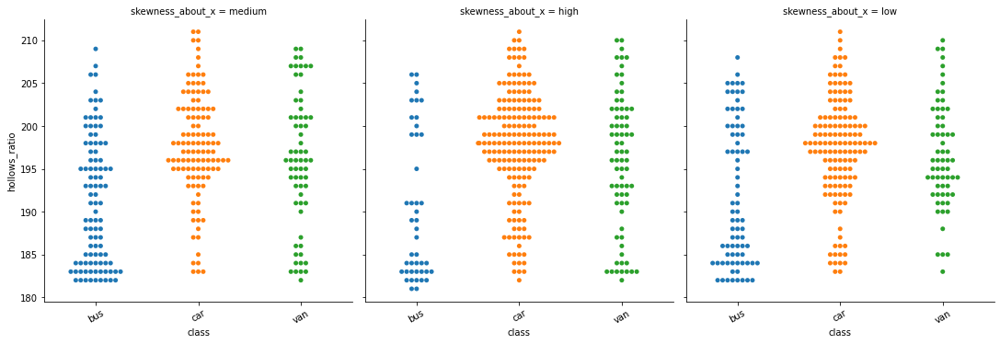

In [18]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['skewness_about'],33)
quant66 = np.percentile(vehicleDfRaw['skewness_about'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66)

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawSkewnessAboutCat = vehicleDfRaw.skewness_about.apply(categoriseData)
vehicleDfRawSkewnessAboutCatGraph = pd.merge(vehicleDfRawSkewnessAboutCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    g = sns.catplot(x="class",y = i ,
               col="skewness_about_x",
               data=vehicleDfRawSkewnessAboutCatGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the skewness_about column
- The skewness_about column are divided in 3 groups :: 
        
        below value 150 is considered as low
        value between 150 and 177 is considered as medium
        above value 177 are considered as High
        
- Class Car is having more data point (dominant) for High skewness_about category.
- Frequncy of data  :: The distribution of data is approximately equal among different skewness_about groups
- When we observe data for scatter_ratio medium and low, the class car and bus have longer distribution against other variables.

33 percentile :  193.0
66 percentile :  199.0


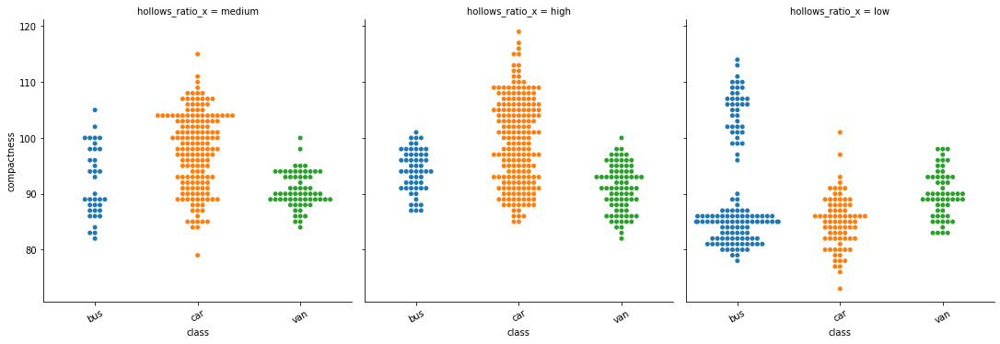

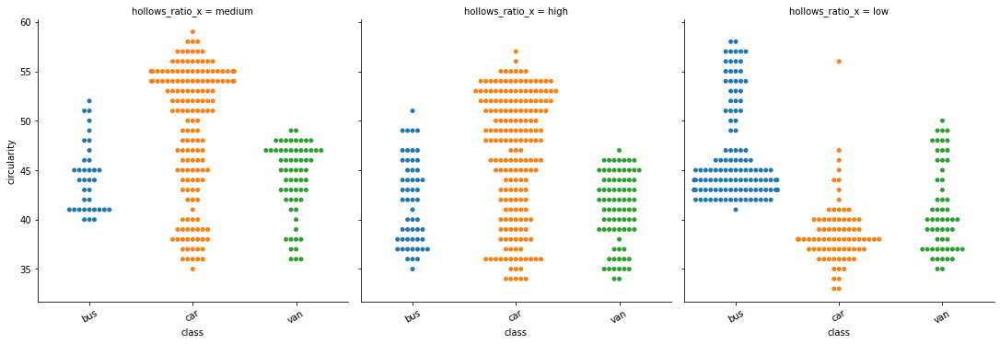

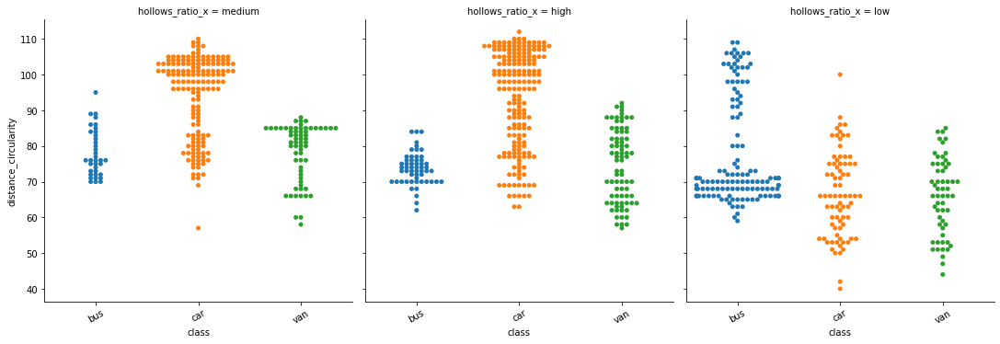

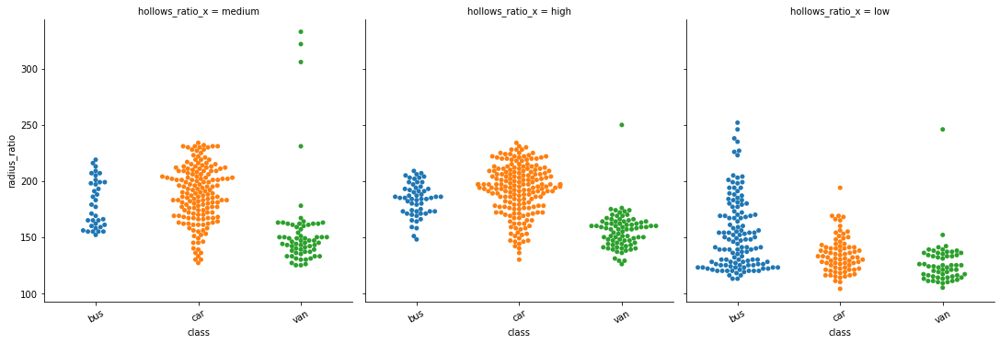

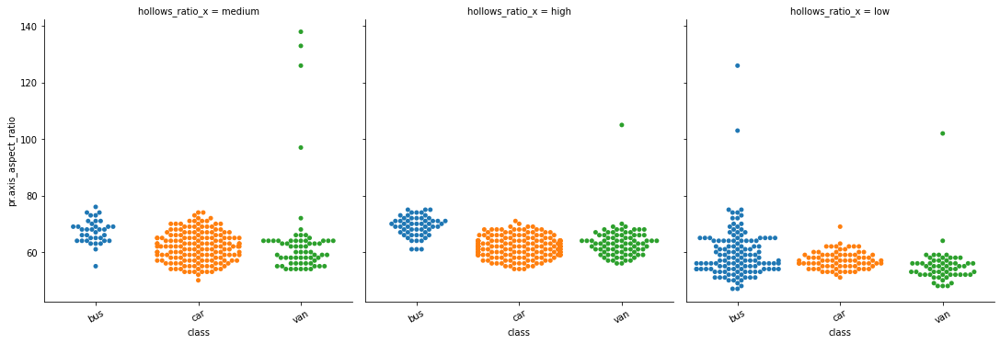

...

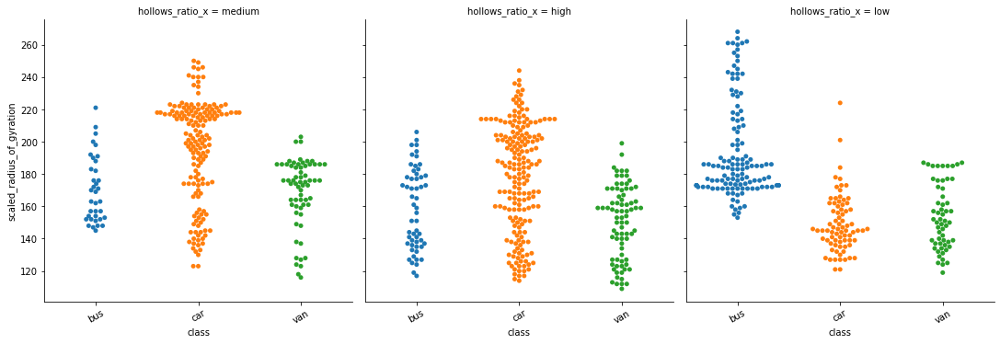

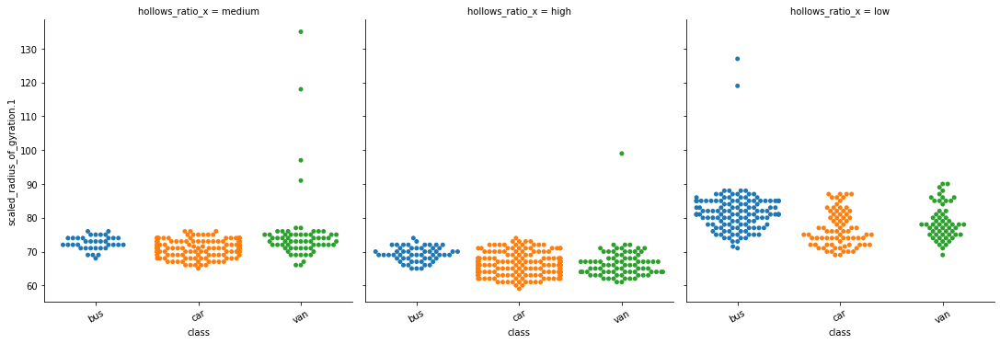

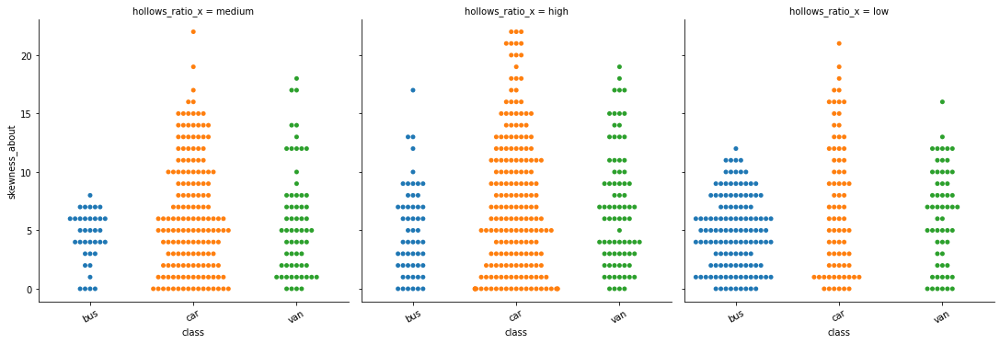

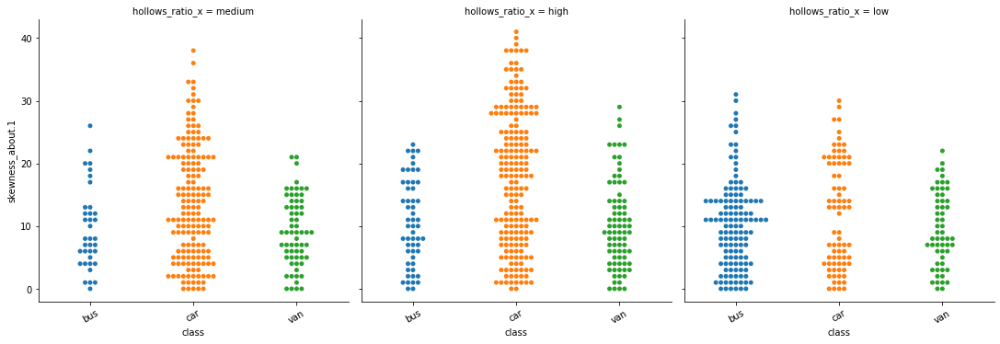

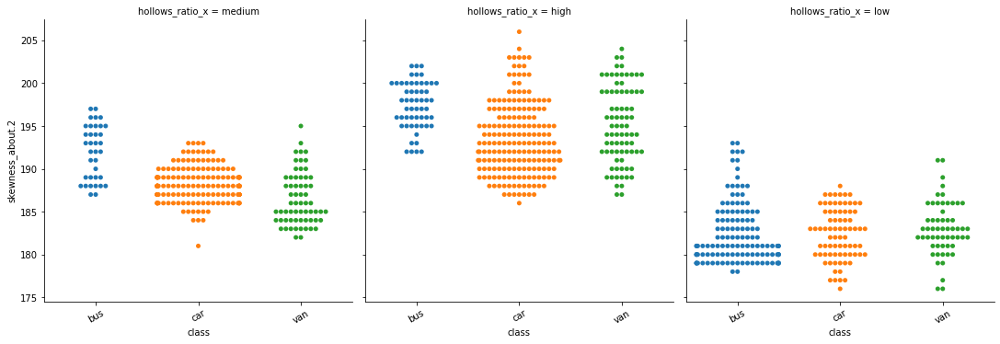

In [19]:
import warnings
warnings.simplefilter("ignore", UserWarning)


quant33 = np.percentile(vehicleDfRaw['hollows_ratio'],33)
quant66 = np.percentile(vehicleDfRaw['hollows_ratio'],66)

print("33 percentile : ",quant33)
print("66 percentile : ",quant66) 

def categoriseData(x):
    if(x<quant33):
        return 'low'
    elif (x >=quant33 and x<quant66):
        return 'medium'
    elif (x >=quant66):
        return 'high'
        
vehicleDfRawHollowsRatioCat = vehicleDfRaw.hollows_ratio.apply(categoriseData)
vehicleDfRawHollowsRatioCatGraph = pd.merge(vehicleDfRawHollowsRatioCat, vehicleDfRaw, left_index=True, right_index=True)

for i in ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2']:
    g = sns.catplot(x="class",y = i ,
               col="hollows_ratio_x",
               data=vehicleDfRawHollowsRatioCatGraph, 
               kind="swarm");
    g.set_xticklabels(rotation=30);

- Ploting other columns against the hollows_ratio column
- The hollows_ratio column are divided in 3 groups :: 
        
        below value 193 is considered as low
        value between 193 and 199 is considered as medium
        above value 199 are considered as High
        
- Class Car is having more data point (dominant) for High hollows_ratio category.
- Frequncy of data  :: The distribution of data is approximately equal among different skewness_about groups
- When we observe data for scatter_ratio medium and low, the class car and bus have longer distribution against other variables.

In [20]:
import scipy.stats as stats
# Using ChiSquare we determine importance of the variable - if the variable if not important - then we can plan to drop the variable.

alpha=0.05
dropColumnsList=[]

def ChiSquareTestIndependence(colX,colY):
    X = vehicleDfRaw[colX].astype(str)
    Y = vehicleDfRaw[colY].astype(str)
    
    crossT = pd.crosstab(Y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(crossT.values)
    
    if p<alpha:
            print("{0} is IMPORTANT for Prediction".format(colX))
    else:
            print("{0} is      NOT      an important predictor".format(colX))
            dropColumnsList.append(colX)

for var in ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']:
    ChiSquareTestIndependence(colX=var,colY="class" )

compactness is IMPORTANT for Prediction
circularity is IMPORTANT for Prediction
distance_circularity is IMPORTANT for Prediction
radius_ratio is IMPORTANT for Prediction
pr.axis_aspect_ratio is IMPORTANT for Prediction
max.length_aspect_ratio is IMPORTANT for Prediction
scatter_ratio is IMPORTANT for Prediction
elongatedness is IMPORTANT for Prediction
pr.axis_rectangularity is IMPORTANT for Prediction
max.length_rectangularity is IMPORTANT for Prediction
scaled_variance is IMPORTANT for Prediction
scaled_variance.1 is IMPORTANT for Prediction
scaled_radius_of_gyration is IMPORTANT for Prediction
scaled_radius_of_gyration.1 is IMPORTANT for Prediction
skewness_about is IMPORTANT for Prediction
skewness_about.1 is IMPORTANT for Prediction
skewness_about.2 is IMPORTANT for Prediction
hollows_ratio is IMPORTANT for Prediction


In [21]:
# vehicleDfRaw.boxplot(figsize=(35,15))
vehicleDfRaw.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

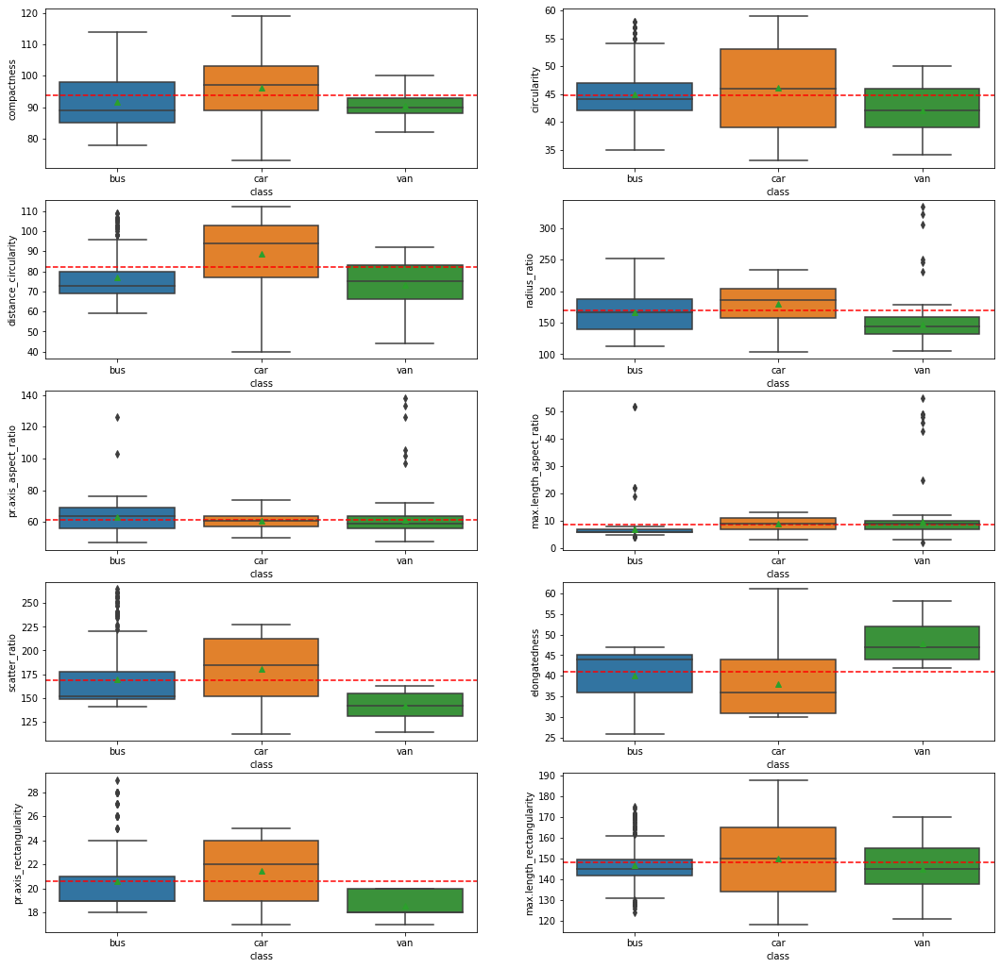

In [22]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(5,2, figsize=(18,18))
listOfColumns = ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity']
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.boxplot(y=vehicleDfRaw[listOfColumns[index]],x=vehicleDfRaw['class'],showmeans=True, ax = ax[j][i]);
            ax[j][i].axhline(vehicleDfRaw[listOfColumns[index]].mean(),color = 'r', ls='--')
            index = index + 1 
fig.show()

- compactness :: In compacteness boxplot, 75% of van class data are below mean taken across dataset compactness variable. Mean and medain for van and car class are close to each other but mean is higher than median in bus class. There are not outlier observed in this column

- circularity :: In circularity boxplot , Mean and Median for all 3 classes are close. There are outliers observed for bus class.

- distance_circularity :: In this boxplot, Mean and median are close for van class, for car class mean is lower than median, for bus class mean is higher then median. 75% of data points are lower than overall mean for bus class. 

- radius_ratio :: In this boxplot, There are outliers observed for van class. Mane and Median are closs for each each class. 75% of data point for van class are below overall mean. Outlier observed in van and bus class.

- pr.axis_aspect_ratio :: Data seems to be equally distributed. Mean , median and overall mean are close to one another.

- max.length_aspect_ratio :: bus class data are below the overall mean. Outlier observed for van and bus class.

- scatter_ratio :: Outlier observed for bus class, Mean is higher than median in bus class. Van class data is below overall mean.

- elongatedness :: mean and median are close to one another for van and car class but mean is well below median for bus class. Van Class data is above overall mean. No Outliers observed.

- pr.axis_rectangularity :: Outliers observed for bus class. Mean and Median are close to one another across all class. Van class data is below overall mean.

- max.length_rectangularity:: Outliers observed for bus class. Mean, median and overall mean are close to one another acorss class.

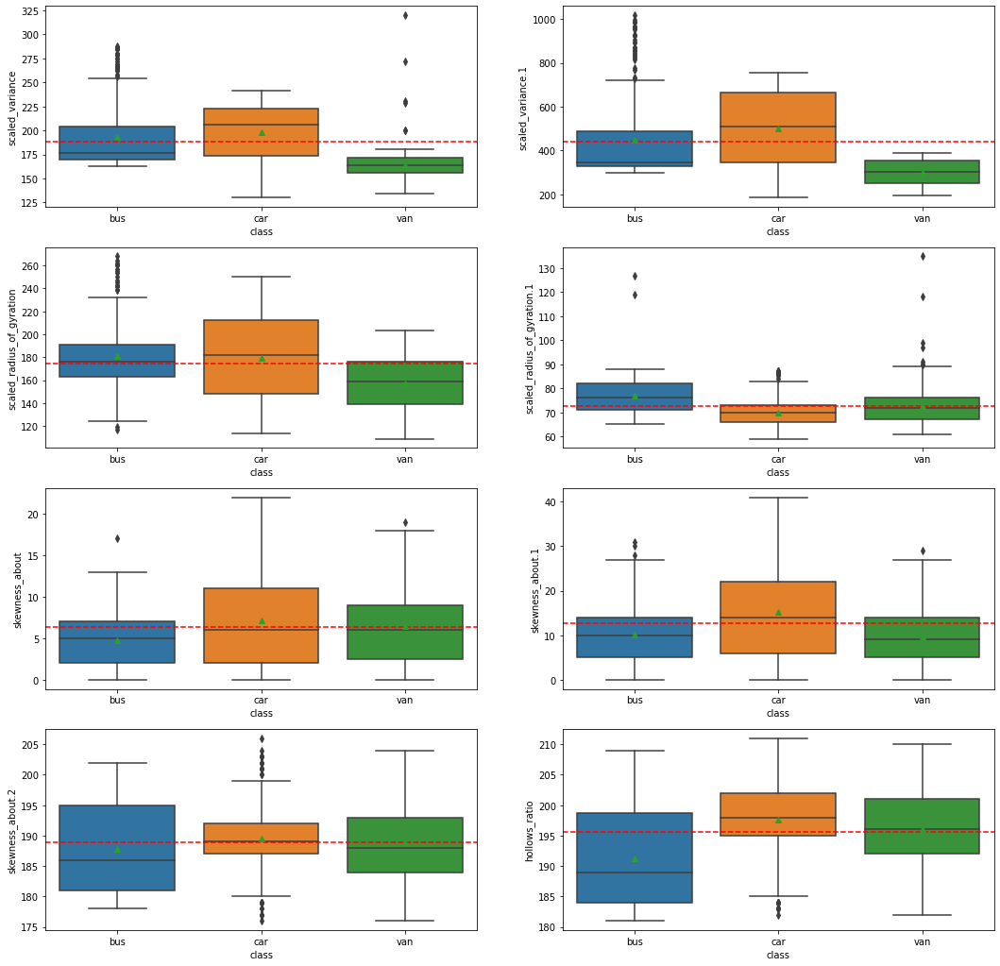

In [23]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(4,2, figsize=(18,18))
listOfColumns = ['scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.boxplot(y=vehicleDfRaw[listOfColumns[index]],x=vehicleDfRaw['class'],showmeans=True, ax = ax[j][i]);
            ax[j][i].axhline(vehicleDfRaw[listOfColumns[index]].mean(),color = 'r', ls='--')
            index = index + 1 
fig.show()

- scaled_variance :: outlier observed for van and bus class. Van class all data points are below overall average. Mean is higher then median in bus class.
- scaled_variance.1 :: outlier observed for bus class.Van class all data points are below overall average. Mean is higher then median in bus class.
- scaled_radius_of_gyration :: outlier observed for bus class. 75% of data point are below overall mean for van class.
- scaled_radius_of_gyration.1 :: outlier observed for all class. Mean , median and overall mean are close to one another.
- skewness_about :: outlier observed for bus, van class. Mean and median are close to one another.
- skewness_about.1  :: outlier observed for bus, van class. Mean and Median are close to one another.
- skewness_about.2 :: outlier observed for car class. Mean, median and overall mean are close to one another. 
- hollows_ratio :: outlier observed for car class. Mean and Median are close to one another in van and car class.  Mean is Above median in bus class. Bus class mean is well below overall mean for bus class

In [24]:
vehicleDfRaw.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

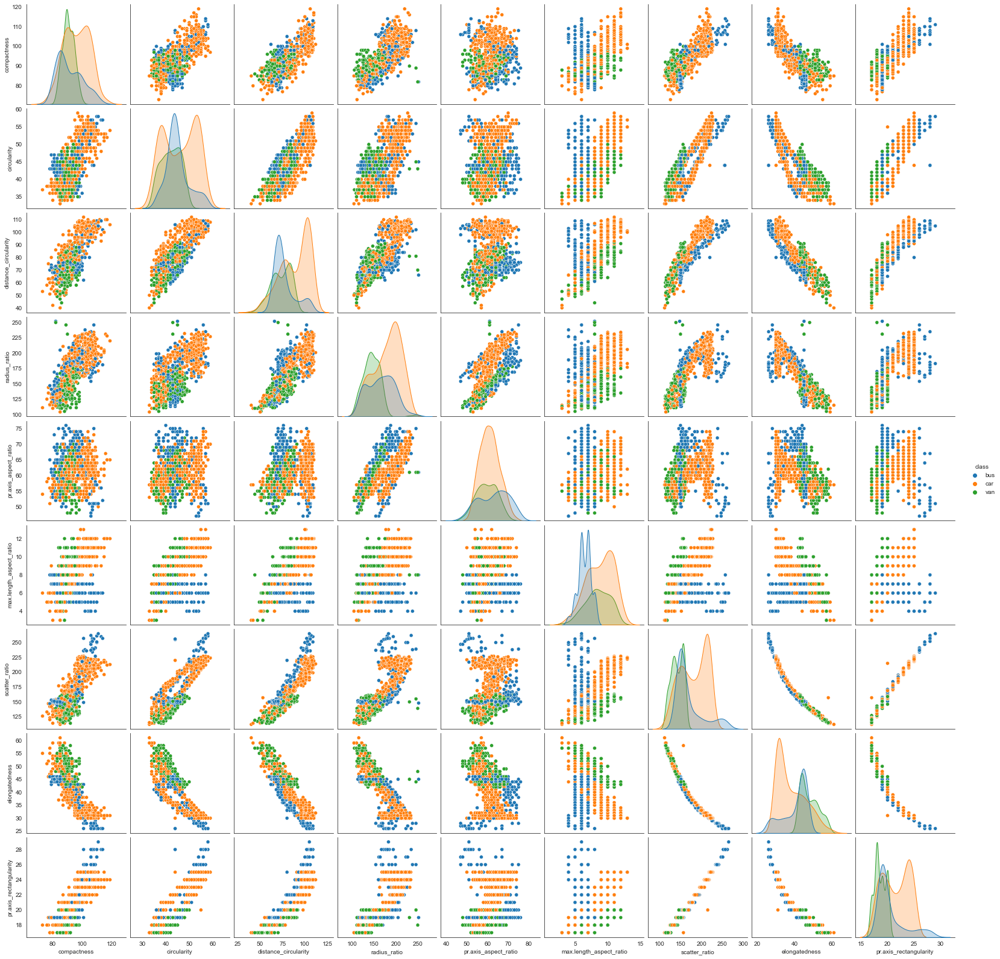

In [51]:
sns.pairplot(vehicleDfRaw[['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity','class']], diag_kind='kde', hue = 'class')  

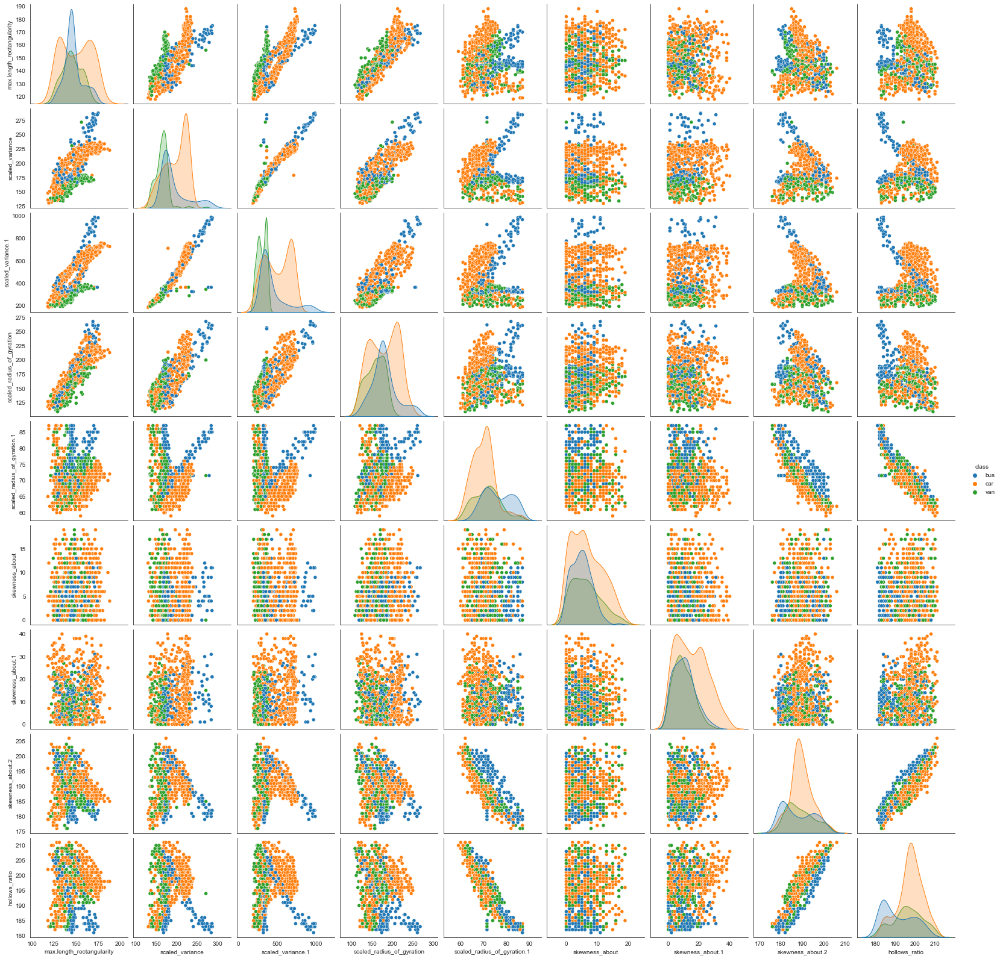

In [52]:
sns.pairplot(vehicleDfRaw[['max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class']], diag_kind='kde', hue = 'class')  

- Looking into diagonal :  we could deduce that there are clear groups in the data which signifies classification in data exists.
- positive and negative correlation exists between many variable - which is signifies that the dataset is good candidate for PCA dimensonality reduction.
- For example: compactness is highly correlated in a positive way with scatter_ratio, pr.axis_rectangularity, scaled_variance1, distance_circularity, scaled_variance, radius_ratio. compactness is highly correlated in a negative way with elongatedness. 
- circularity has positive linear relationship with distance_circularity, scatter_ratio, pr.axis_rectangularity, max.axis_rectangularity, scaled_variance, scaled_variance1, scaled_radius_of_gyration. circularity has negative linear relationship with elongatedness.
- distance_circularity has positive linear relationship with radius_ratio, scatter_ratio, pr.axis_rectangularity, max.axis_rectangularity, scaled_variance, scaled_variance1, scaled_radius_of_gyration. distance_circularity has negative linear relationship with elongatedness.
- radius_ratio has positive linear relationship with pr.axis_aspect_ratio, scatter_ratio, scaled_variance, scaled_variance1, scaled_radius_of_gyration. radius_ratio has negative linear relationship with elongatedness.

- Handling outliers using median value

In [26]:
#find the outliers and replace them by median
for col_name in vehicleDfRaw.columns[:-1]:
    q1 = vehicleDfRaw[col_name].quantile(0.25)
    q3 = vehicleDfRaw[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1-1.5*iqr
    high = q3+1.5*iqr
    
    vehicleDfRaw.loc[(vehicleDfRaw[col_name] < low) | (vehicleDfRaw[col_name] > high), col_name] = vehicleDfRaw[col_name].median()

    Checking if there are any outliers.

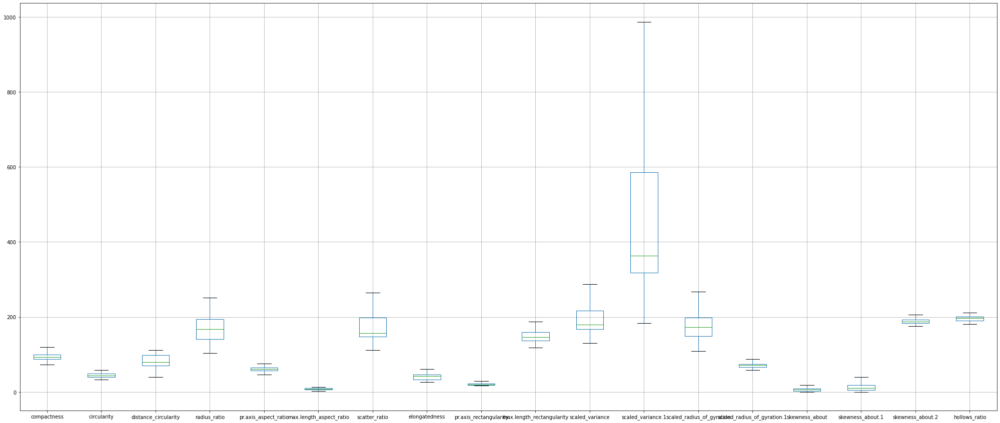

In [27]:
vehicleDfRaw.boxplot(figsize=(35,15));

    There are no outliers observed.

In [28]:
vehicleDfRaw.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

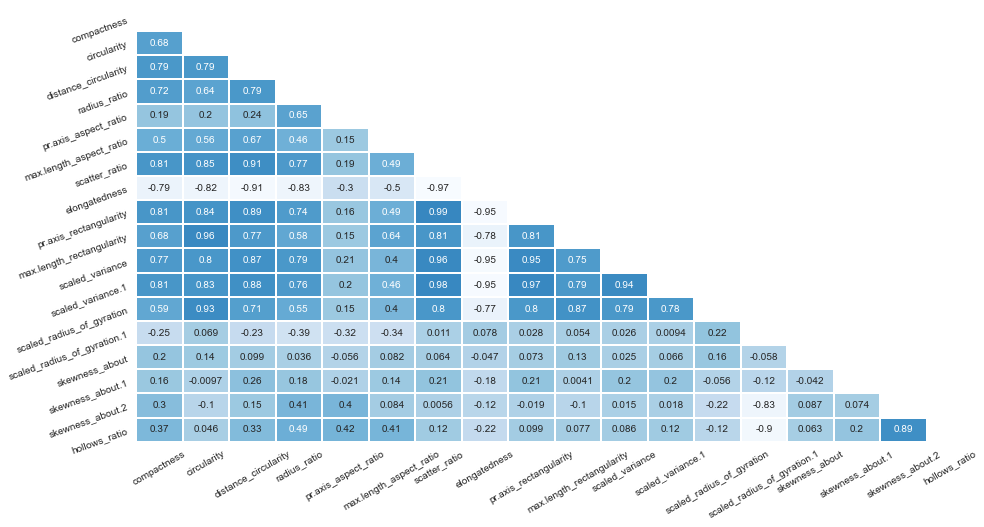

In [29]:
#Correlation Matrix
df = vehicleDfRaw
corr = df.corr() # correlation matrix
lower_triangle = np.tril(corr, k = -1) 
mask = lower_triangle == 0  # to mask the upper triangle in the following heatmap

plt.figure(figsize = (15,8)) 
sns.set_style(style = 'white')  # Setting it to white so that we do not see the grid lines
sns.heatmap(lower_triangle, center=0.5, cmap= 'Blues', annot= True, xticklabels = corr.index, yticklabels = corr.columns, cbar= False, linewidths= 1, mask = mask)  
plt.xticks(rotation = 30)   
plt.yticks(rotation = 20) 
plt.show()

- There are both negative and positive correlation observed between variables.
- There are some values observed which are close to 0.
- Since there are many columns, this data needs PCA and reduce number of features before model training.
- pr.axis_rectagularity is having good correlation with other columns.
- hollows_ratio is having less correaltion with other columns.

###### Classifier: 
Design and train a best fit SVM classier using all the data attribute

In [98]:
#independent and dependent variables
Xvalues= vehicleDfRaw.iloc[:,0:18]
yvalue= vehicleDfRaw.iloc[:,18]

In [99]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(Xvalues,yvalue, test_size = 0.3, random_state = 10)

In [100]:
#Creating SVM classifier
#using default params - (Cfloat, default=1.0) , (kernel default=’rbf’)
clf = SVC()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)

In [101]:
print('Accuracy on Training data: ',clf.score(X_train, y_train))
print('Accuracy on Testing data: ', clf.score(X_test , y_test))

Accuracy on Training data:  0.6621621621621622
Accuracy on Testing data:  0.6496062992125984


-  The score seems to be low in accuracy for both test and train data.

In [102]:
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Recall value:  0.6198542982030112
Precision value:  0.6166822284469343
Confusion Matrix:
 [[34  4 22]
 [31 95  0]
 [ 6 26 36]]
Classification Report:
               precision    recall  f1-score   support

         bus       0.48      0.57      0.52        60
         car       0.76      0.75      0.76       126
         van       0.62      0.53      0.57        68

    accuracy                           0.65       254
   macro avg       0.62      0.62      0.62       254
weighted avg       0.66      0.65      0.65       254



 - The recall, precision and f1 are low, this is without applying PCA.

In [103]:
#scaling data 
from scipy.stats import zscore
XScaled=Xvalues.apply(zscore)

#applying PCA dimension reduction
covMatrix = np.cov(XScaled,rowvar=False)
pca = PCA(n_components=8)
pca.fit(XScaled)

PCA(n_components=8)

In [104]:
print(pca.components_)

[[ 0.27250289  0.28725469  0.30242111  0.26971354  0.09786073  0.19520014
   0.31052393 -0.3090069   0.307287    0.27815416  0.29976509  0.30553237
   0.26323762 -0.04193594  0.03608321  0.05872048  0.03801314  0.08474   ]
 [-0.08704358  0.13162176 -0.04614301 -0.19793126 -0.25783995 -0.10804563
   0.07528535 -0.01322994  0.0875602   0.12215424  0.07726575  0.07150302
   0.21058205  0.50362158 -0.01576632 -0.09274624 -0.50162122 -0.50761211]
 [-0.03818521 -0.20114691  0.06346211  0.05628517 -0.06199275 -0.14895782
   0.10904283 -0.09085269  0.1060705  -0.21368469  0.1445998   0.11034374
  -0.20287019  0.07386402 -0.55917399  0.6706805  -0.06224071 -0.04170535]
 [ 0.13867501 -0.03805548  0.10895429 -0.25435509 -0.61276572  0.27867816
   0.00539295  0.06521486  0.03089915  0.04146747 -0.06400509 -0.00219687
  -0.08553965 -0.11539962  0.47370331  0.42842603 -0.0274096   0.09603749]
 [ 0.13710147 -0.13899555 -0.08001743  0.13374437  0.12360146 -0.63489336
   0.08555745 -0.07907344  0.08164

In [105]:
pca.explained_variance_ratio_.sum()

0.9723446088994467

In [106]:
print(pca.explained_variance_ratio_)

[0.54099325 0.18593103 0.06616512 0.0629155  0.04905291 0.03697101
 0.01765416 0.01266163]


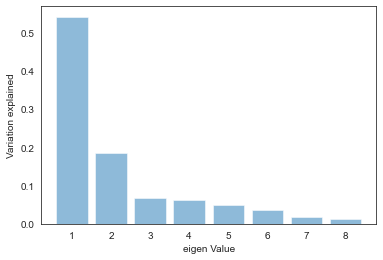

In [107]:
plt.bar(list(range(1,9)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

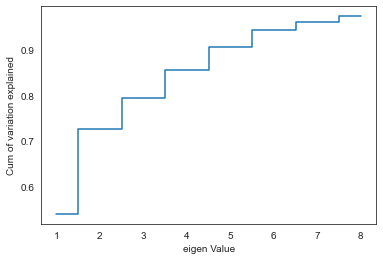

In [108]:
plt.step(list(range(1,9)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

- Dimension reduction eliminiate 10 principal components because almost 97.2% of the data is captured by 8 principal components.

In [109]:
pca8 = PCA(n_components=8)
pca8.fit(XScaled)
print(pca8.components_)
print(pca8.explained_variance_ratio_)
Xpca8 = pca8.transform(XScaled)

[[ 0.27250289  0.28725469  0.30242111  0.26971354  0.09786073  0.19520014
   0.31052393 -0.3090069   0.307287    0.27815416  0.29976509  0.30553237
   0.26323762 -0.04193594  0.03608321  0.05872048  0.03801314  0.08474   ]
 [-0.08704358  0.13162176 -0.04614301 -0.19793126 -0.25783995 -0.10804563
   0.07528535 -0.01322994  0.0875602   0.12215424  0.07726575  0.07150302
   0.21058205  0.50362158 -0.01576632 -0.09274624 -0.50162122 -0.50761211]
 [-0.03818521 -0.20114691  0.06346211  0.05628517 -0.06199275 -0.14895782
   0.10904283 -0.09085269  0.1060705  -0.21368469  0.1445998   0.11034374
  -0.20287019  0.07386402 -0.55917399  0.6706805  -0.06224071 -0.04170535]
 [ 0.13867501 -0.03805548  0.10895429 -0.25435509 -0.61276572  0.27867816
   0.00539295  0.06521486  0.03089915  0.04146747 -0.06400509 -0.00219687
  -0.08553965 -0.11539962  0.47370331  0.42842603 -0.0274096   0.09603749]
 [ 0.13710147 -0.13899555 -0.08001743  0.13374437  0.12360146 -0.63489336
   0.08555745 -0.07907344  0.08164

In [110]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(Xpca8,yvalue, test_size = 0.3, random_state = 10)

In [111]:
clf = SVC()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)

In [112]:
# check the accuracy on the training data
print('Accuracy on Training data: ',clf.score(X_train, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ', clf.score(X_test , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.9510135135135135
Accuracy on Testing data:  0.9409448818897638
Recall value:  0.9364850250930873
Precision value:  0.9413250975207047
Confusion Matrix:
 [[ 67   2   1]
 [  4 119   4]
 [  0   4  53]]
Classification Report:
               precision    recall  f1-score   support

         bus       0.94      0.96      0.95        70
         car       0.95      0.94      0.94       127
         van       0.91      0.93      0.92        57

    accuracy                           0.94       254
   macro avg       0.94      0.94      0.94       254
weighted avg       0.94      0.94      0.94       254



**Conclusion:** Showcase key pointer on how dimensional reduction helped in this case.

- Accuracy on test and trained data increased when we use data from PCA.
- Reducing number of column from 18 to 8 has improved accuracy.
- recall, precision also increased after using data from PCA.
- When Confusion matrix compared  type 1 and type 2 errors reduced.